# Kalman filtering and OLS estimation for atypical performance estimation on the US equity market

## Packages

In [417]:
'''
! pip install pykalman
'''

'\n! pip install pykalman\n'

In [418]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from pykalman import KalmanFilter
import yfinance as yf

## Data manipulation and cleaning

In [419]:
path = "/Users/youssef/Library/CloudStorage/OneDrive-UniversiteEvryVald'Essonne/Google Drive/Mon Drive/Research/Models/AM_scripts/Perf Atyp/Dataset Regression.xlsx"

In [420]:
data_filtered = pd.read_excel(path, sheet_name='Dataset', skiprows=1)
data_filtered.rename(columns={data_filtered.columns[0]: 'Date'}, inplace=True)
data_filtered['Date'] = pd.to_datetime(data_filtered['Date'])
data_filtered.set_index('Date', inplace=True)

print(data_filtered.head())
print(data_filtered.describe())

            500.PA    .5SP60    .5SP55    .5SP50    .5SP45    .5SP40  \
Date                                                                   
2015-01-02  28.604  190.5129  241.5146  153.3535  690.9184  333.4120   
2015-01-05  28.440  190.8761  238.3541  151.8027  678.7169  326.4271   
2015-01-06  28.193  192.9312  238.6411  152.3304  670.4178  321.4345   
2015-01-07  28.611  195.8489  240.9727  150.2789  676.2165  324.9836   
2015-01-08  29.208  196.8414  242.6722  152.6020  691.5786  329.7718   

              .5SP35    .5SP30    .5SP25    .5SP20    .5SP15    .5SP10  
Date                                                                    
2015-01-02  795.0670  497.8320  568.6052  485.7440  305.8206  589.1193  
2015-01-05  790.2247  494.0007  557.3096  474.4678  297.6379  565.6016  
2015-01-06  788.1090  493.9341  552.0490  468.8502  295.5647  558.1934  
2015-01-07  805.9986  502.5516  560.4981  471.7062  298.5209  560.0933  
2015-01-08  819.8636  510.1515  568.8319  481.1067  305.6

In [421]:
if data_filtered.apply(lambda col: col.notnull().sum()).nunique() == 1:
    print("All columns are aligned with", data_filtered.shape[0], "data points each.")
else:
    print("There is still misalignment in the data.")
    
print(data_filtered.count())

There is still misalignment in the data.
500.PA    2439
.5SP60    2398
.5SP55    2398
.5SP50    2398
.5SP45    2398
.5SP40    2398
.5SP35    2398
.5SP30    2398
.5SP25    2398
.5SP20    2398
.5SP15    2398
.5SP10    2398
dtype: int64


In [422]:
name_mapping = {
    "500.PA": "AMND S&P 500/d",
    ".5SP60": "S&P Real Estate",
    ".5SP55": "S&P Utilities",
    ".5SP50": "S&P Consumer Services",
    ".5SP45": "S&P Information Technology",
    ".5SP40": "S&P Financials",
    ".5SP35": "S&P Health Care",
    ".5SP30": "S&P Consumer Staples",
    ".5SP25": "S&P Consumer Discretionary",
    ".5SP20": "S&P Industrials",
    ".5SP15": "S&P Materials",
    ".5SP10": "S&P Energy"
}

In [423]:
data_filtered.dropna(inplace=True)

data_filtered.rename(columns=name_mapping, inplace=True)

print("Final structure:")
print(data_filtered.info())

Final structure:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2374 entries, 2015-01-02 to 2024-07-15
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   AMND S&P 500/d              2374 non-null   float64
 1   S&P Real Estate             2374 non-null   float64
 2   S&P Utilities               2374 non-null   float64
 3   S&P Consumer Services       2374 non-null   float64
 4   S&P Information Technology  2374 non-null   float64
 5   S&P Financials              2374 non-null   float64
 6   S&P Health Care             2374 non-null   float64
 7   S&P Consumer Staples        2374 non-null   float64
 8   S&P Consumer Discretionary  2374 non-null   float64
 9   S&P Industrials             2374 non-null   float64
 10  S&P Materials               2374 non-null   float64
 11  S&P Energy                  2374 non-null   float64
dtypes: float64(12)
memory usage: 241.1 KB
None


In [424]:
data_filtered.to_excel('Adjusted Dataset Regression.xlsx')

In [425]:
# Table with explanations for each ticker

data = {
    "RIC": ["500.PA", ".5SP60", ".5SP55", ".5SP50", ".5SP45", ".5SP40", ".5SP35", ".5SP30", ".5SP25", ".5SP20", ".5SP15", ".5SP10"],
    "Name": [
        "AMUNDI S&P 500 ETF UCITS", 
        "S&P Real Estate", 
        "S&P Utilities", 
        "S&P Consumer Services", 
        "S&P Information Technology", 
        "S&P Financials", 
        "S&P Health Care", 
        "S&P Consumer Staples", 
        "S&P Consumer Discretionary", 
        "S&P Industrials", 
        "S&P Materials", 
        "S&P Energy"
    ]
}

asset_classes = pd.DataFrame(data)
print(asset_classes)


       RIC                        Name
0   500.PA    AMUNDI S&P 500 ETF UCITS
1   .5SP60             S&P Real Estate
2   .5SP55               S&P Utilities
3   .5SP50       S&P Consumer Services
4   .5SP45  S&P Information Technology
5   .5SP40              S&P Financials
6   .5SP35             S&P Health Care
7   .5SP30        S&P Consumer Staples
8   .5SP25  S&P Consumer Discretionary
9   .5SP20             S&P Industrials
10  .5SP15               S&P Materials
11  .5SP10                  S&P Energy


In [426]:
arith_returns = data_filtered.pct_change().dropna()

arith_returns.rename(columns=name_mapping, inplace=True)

arith_returns['AMND S&P 500/d'].fillna(method='ffill', inplace=True)

print(arith_returns.head())
print(arith_returns.info())
print(arith_returns.describe())  
print("Shape of the dataset:", arith_returns.shape)

            AMND S&P 500/d  S&P Real Estate  S&P Utilities  \
Date                                                         
2015-01-05       -0.005733         0.001906      -0.013086   
2015-01-06       -0.008685         0.010767       0.001204   
2015-01-07        0.014826         0.015123       0.009770   
2015-01-08        0.020866         0.005068       0.007053   
2015-01-09       -0.009176         0.001445      -0.006510   

            S&P Consumer Services  S&P Information Technology  S&P Financials  \
Date                                                                            
2015-01-05              -0.010113                   -0.017660       -0.020950   
2015-01-06               0.003476                   -0.012228       -0.015295   
2015-01-07              -0.013467                    0.008649        0.011041   
2015-01-08               0.015459                    0.022718        0.014734   
2015-01-09              -0.006605                   -0.002799       -0.013376  

In [427]:
annualized_mean_returns = ((1 + arith_returns).prod()) ** (252 / len(arith_returns)) - 1

annualized_std_dev = arith_returns.std() * np.sqrt(252)

annualized_results = pd.DataFrame({
    'Annualized mean return': annualized_mean_returns,
    'Annualized volatility': annualized_std_dev
})

annualized_results

,Annualized mean return,Annualized volatility
AMND S&P 500/d,0.143632,0.171638
S&P Real Estate,0.030118,0.208390
S&P Utilities,0.041197,0.196022
S&P Consumer Services,0.078267,0.215859
S&P Information Technology,0.221591,0.237414
S&P Financials,0.084288,0.226154
S&P Health Care,0.085472,0.169758
S&P Consumer Staples,0.054964,0.148600
S&P Consumer Discretionary,0.112312,0.214117
S&P Industrials,0.086184,0.198060


In [428]:
data_weights = "/Users/youssef/Library/CloudStorage/OneDrive-UniversiteEvryVald'Essonne/Google Drive/Mon Drive/Research/Models/AM_scripts/Perf Atyp/sp500_sector_weights.xlsx"

In [429]:
# S&P 500 weights dataframe creation

data_weights_index = pd.read_excel(data_weights, sheet_name='Adjusted data')
data_weights_index.drop(data_weights_index.columns[-1], axis=1, inplace=True)
data_weights_index['Date'] = pd.to_datetime(data_weights_index['Date'])
data_weights_index.set_index('Date', inplace=True)

In [430]:
fund_returns_df = arith_returns[['AMND S&P 500/d']].copy()

In [431]:
# Renaming data_weights dataframe

new_mapping = {
    "S&P 500 REAL ESTATE IDX": "S&P Real Estate",
    "S&P 500 MATERIALS INDEX": "S&P Materials", 
    "S&P 500 UTILITIES INDEX": "S&P Utilities",
    "S&P 500 ENERGY INDEX": "S&P Energy",
    "S&P 500 CONS STAPLES IDX": "S&P Consumer Staples",
    "S&P 500 INDUSTRIALS IDX": "S&P Industrials",
    "S&P 500 COMM SVC": "S&P Consumer Services",  
    "S&P 500 CONS DISCRET IDX": "S&P Consumer Discretionary",  
    "S&P 500 HEALTH CARE IDX": "S&P Health Care",
    "S&P 500 FINANCIALS INDEX": "S&P Financials",
    "S&P 500 INFO TECH": "S&P Information Technology"
}

In [432]:
filtered_results.rename(columns=new_mapping, inplace=True)

In [433]:
data_weights_index.rename(columns=new_mapping, inplace=True)

In [434]:
# Fusion de la dataframe de rendement de fond (AMND S&P 500/d) avec les facteurs de marchés (secteurs S&P 500)

# Synchronize data to common date range
common_dates = fund_returns_df.index.intersection(data_weights_index.index)
fund_filtered = fund_returns_df.loc[common_dates]
weights_filtered = data_weights_index.loc[common_dates]

In [435]:
# Filtering of the returns
common_dates_returns = fund_returns_df.index.intersection(arith_returns.index)
fund_filtration = fund_returns_df.loc[common_dates]
arith_returns_filtered = arith_returns.loc[common_dates]

In [436]:
# Data frame using fund return / market factors (S&P) sector returns
return_data = pd.merge(fund_filtration , arith_returns_filtered, left_index=True, right_index=True, how='left')
return_filtration = return_data.dropna()

In [437]:
# Data frame using fund return / market factors (S&P) sector weights
regression_data = pd.merge(fund_filtered, weights_filtered, left_index=True, right_index=True, how='left')
regression_data = regression_data.dropna()

In [438]:
print("Filtered results columns:", filtered_results.columns)
print("Data weights columns:", data_weights_index.columns)

Filtered results columns: Index(['S&P Real Estate', 'S&P Utilities', 'S&P Consumer Services',
       'S&P Information Technology', 'S&P Financials', 'S&P Health Care',
       'S&P Consumer Staples', 'S&P Consumer Discretionary', 'S&P Industrials',
       'S&P Materials', 'S&P Energy'],
      dtype='object')
Data weights columns: Index(['S&P Real Estate', 'S&P Materials', 'S&P Utilities', 'S&P Energy',
       'S&P Consumer Staples', 'S&P Industrials', 'S&P Consumer Services',
       'S&P Consumer Discretionary', 'S&P Health Care', 'S&P Financials'],
      dtype='object')


In [439]:
# Computation of returns for the fund wrt benchmark

us_equity_index = yf.download('^GSPC', start='2015-05-01', end='2024-07-15') 
us_equity_index['Daily Returns'] = us_equity_index['Adj Close'].pct_change()

# Alignment procedure

common_dates = fund_returns_df.index.intersection(us_equity_index.index)
fund_returns_aligned = fund_returns_df.loc[common_dates]
market_returns_aligned = us_equity_index.loc[common_dates, 'Daily Returns']

performance_difference = fund_returns_aligned['AMND S&P 500/d'] - market_returns_aligned

results_df = pd.DataFrame({
    'Fund returns': fund_returns_aligned['AMND S&P 500/d'],
    'Market returns': market_returns_aligned,
    'Performance difference': performance_difference
})

results_df.to_csv('fund_performance_vs_market.csv')

print(results_df.head())

[*********************100%%**********************]  1 of 1 completed
            Fund returns  Market returns  Performance difference
Date                                                            
2015-05-04      0.010192        0.002941                0.007251
2015-05-05     -0.013411       -0.011837               -0.001573
2015-05-06     -0.016229       -0.004456               -0.011773
2015-05-07      0.005876        0.003774                0.002102
2015-05-08      0.017010        0.013458                0.003552


## Data visualisation

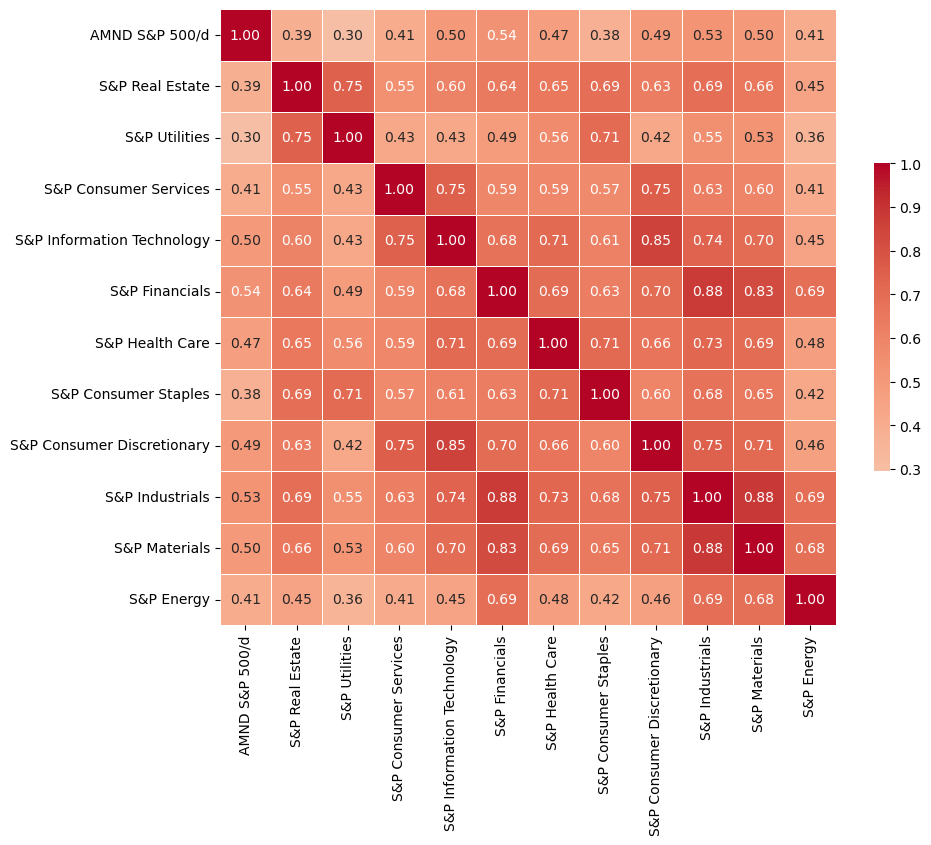

In [440]:
correlation_matrix = arith_returns.corr()


plt.figure(figsize=(10, 8))


sns.heatmap(correlation_matrix, cmap='coolwarm', vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},
            annot=True, fmt=".2f", annot_kws={"size": 10})

plt.show()

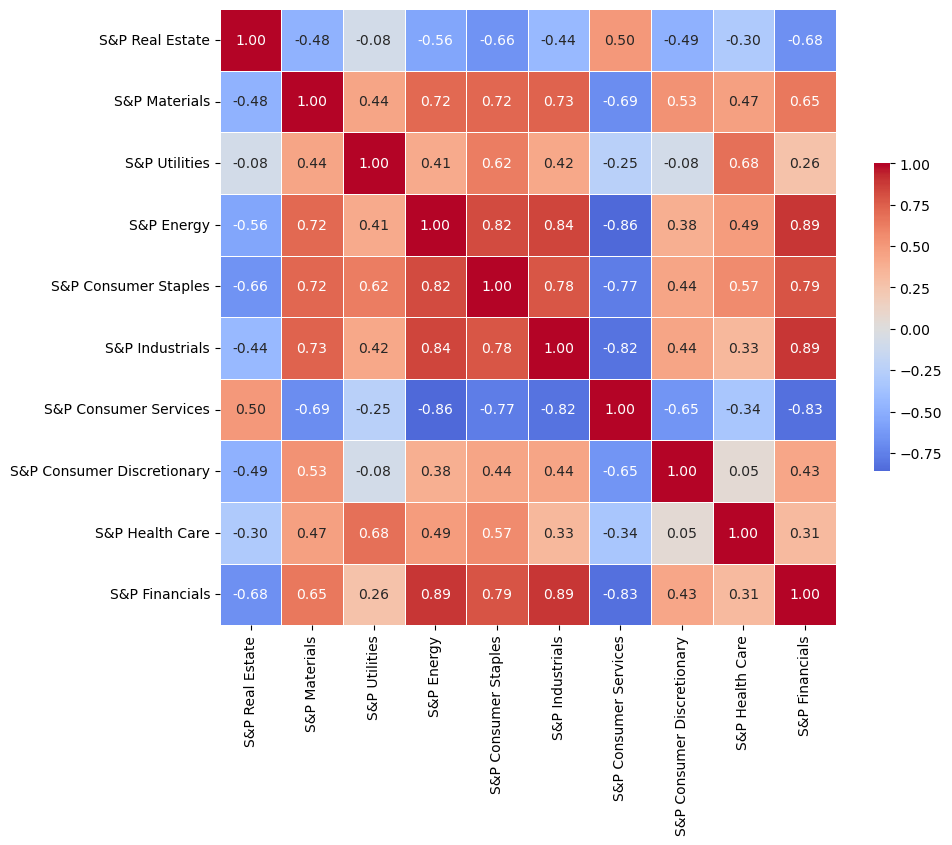

In [441]:
#Correlation of weights (S&P 500 sector weights)

correlation_matrix = data_weights_index.corr()


plt.figure(figsize=(10, 8))


sns.heatmap(correlation_matrix, cmap='coolwarm', vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5},
            annot=True, fmt=".2f", annot_kws={"size": 10})

plt.show()

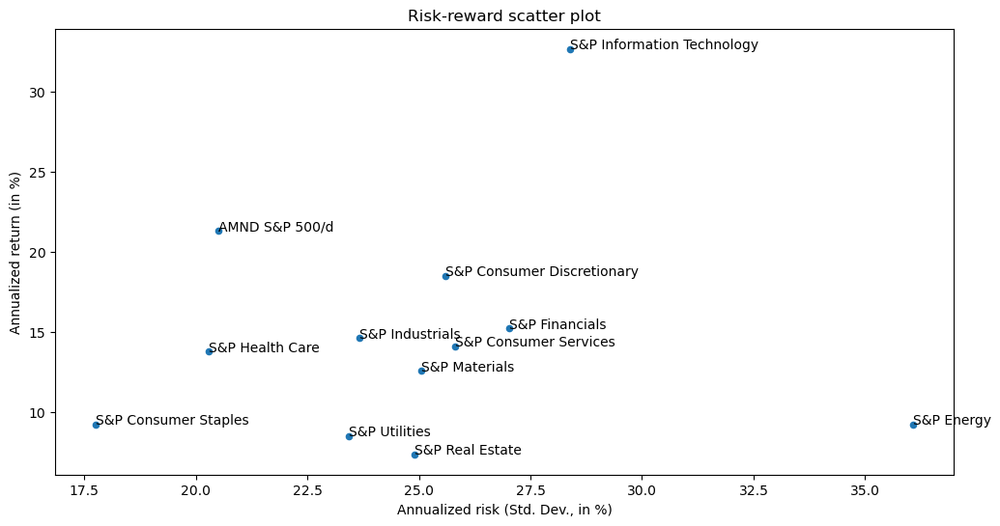

In [442]:
risk_reward = pd.DataFrame({
    'Return': arith_returns.mean() * 360 * 100,  
    'Risk': arith_returns.std() * np.sqrt(360) * 100  
})
risk_reward.plot(kind='scatter', x='Risk', y='Return', figsize=(12, 6))
plt.title('Risk-reward scatter plot')
plt.xlabel('Annualized risk (Std. Dev., in %)')
plt.ylabel('Annualized return (in %)')
for i, txt in enumerate(risk_reward.index):
    plt.annotate(txt, (risk_reward['Risk'][i], risk_reward['Return'][i]))

plt.show()

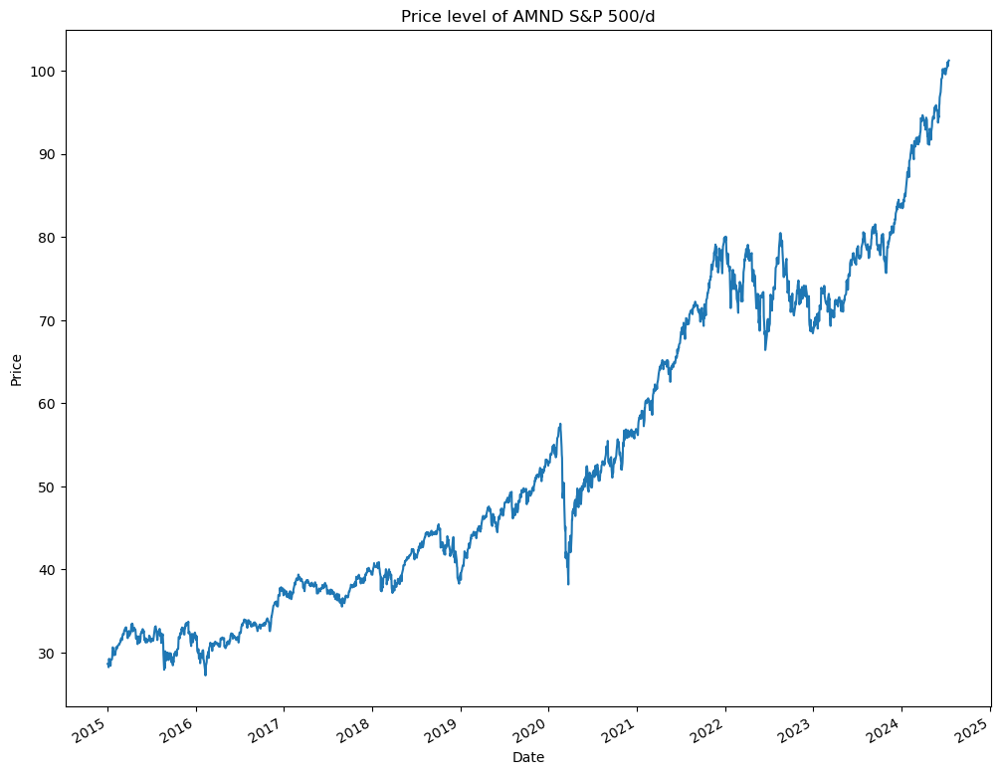

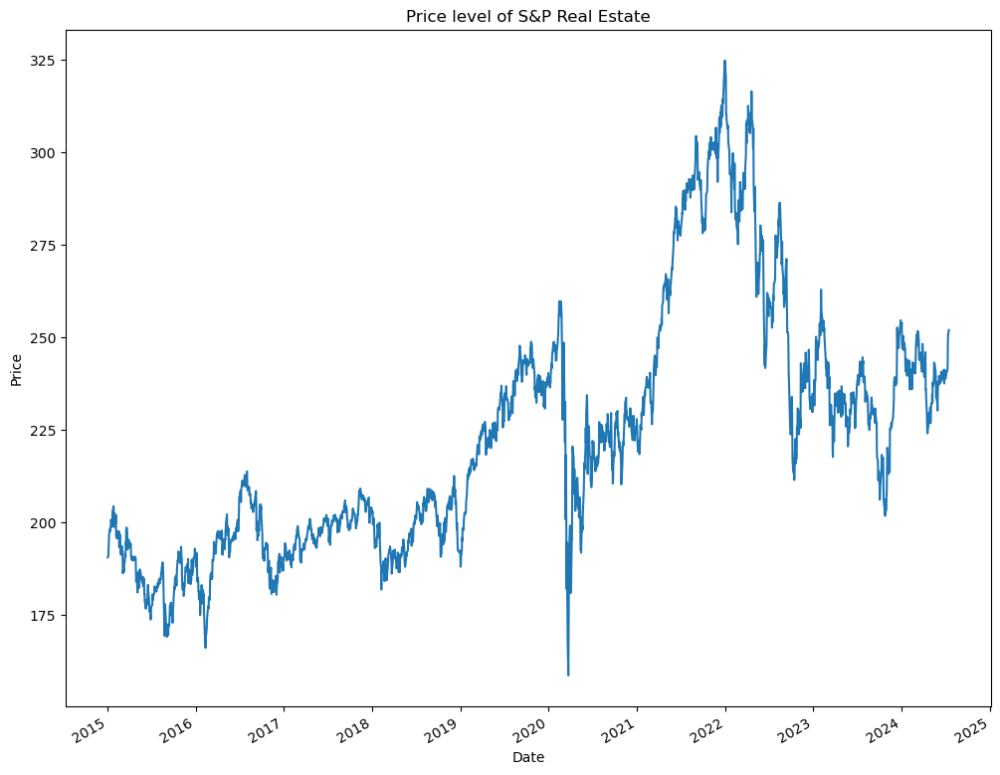

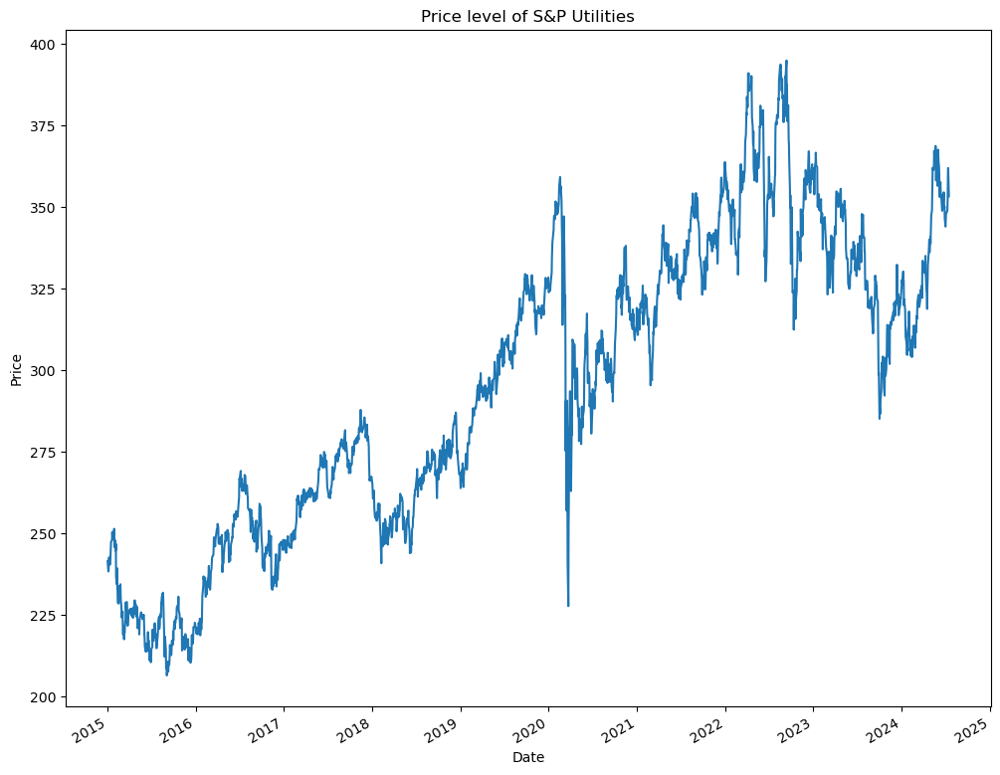

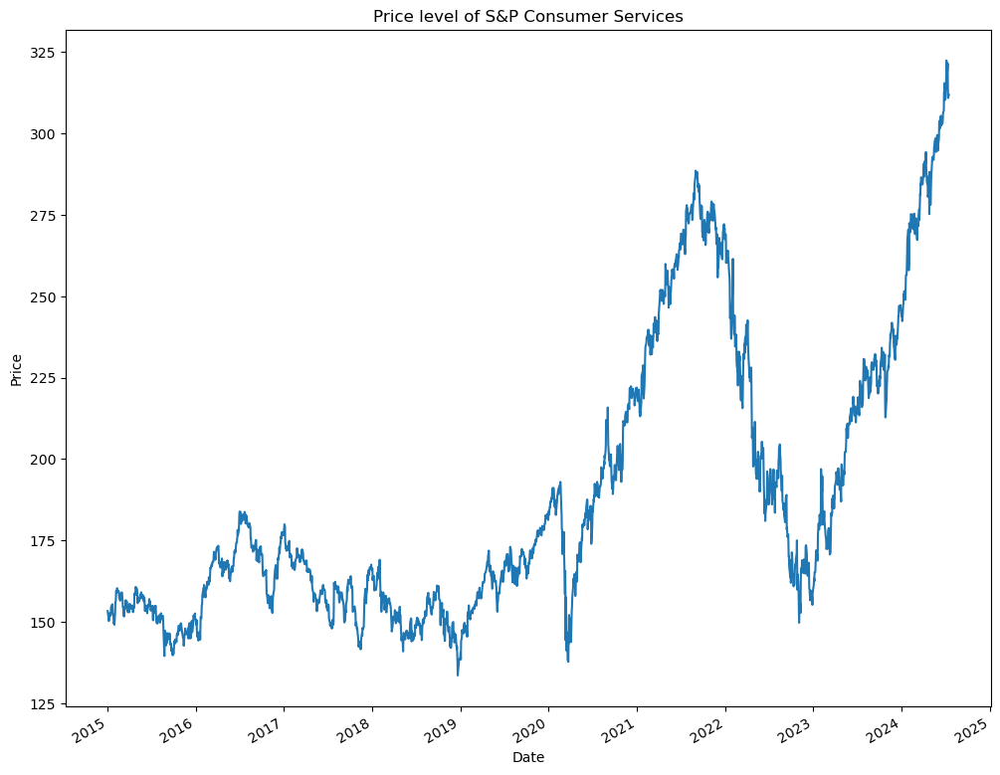

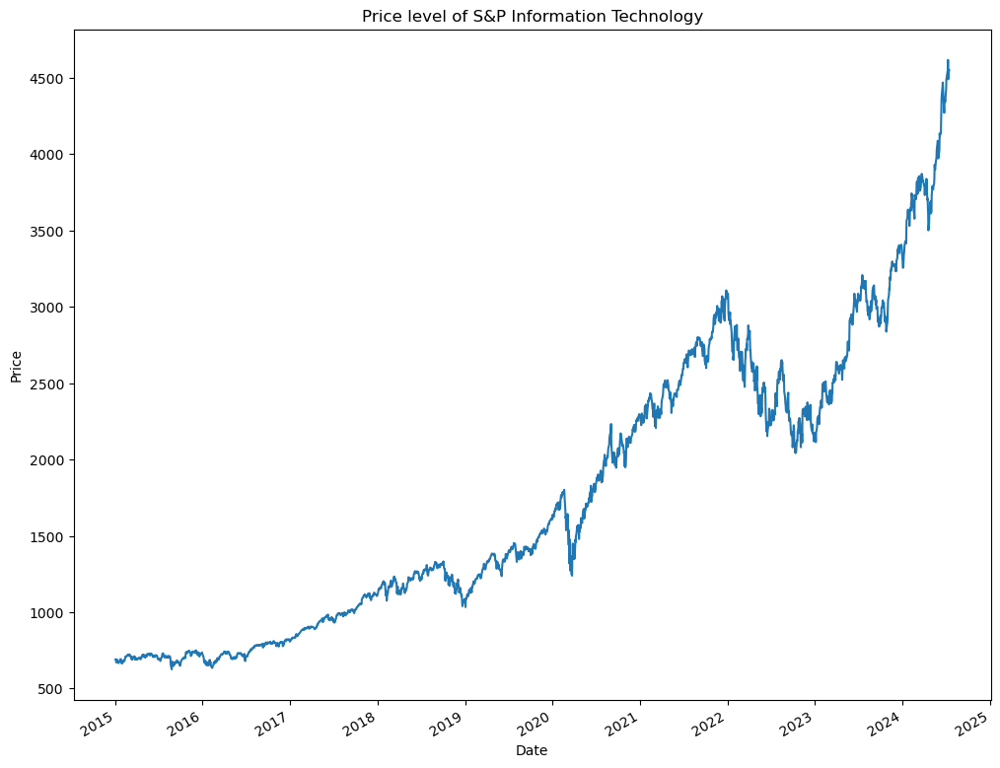

...

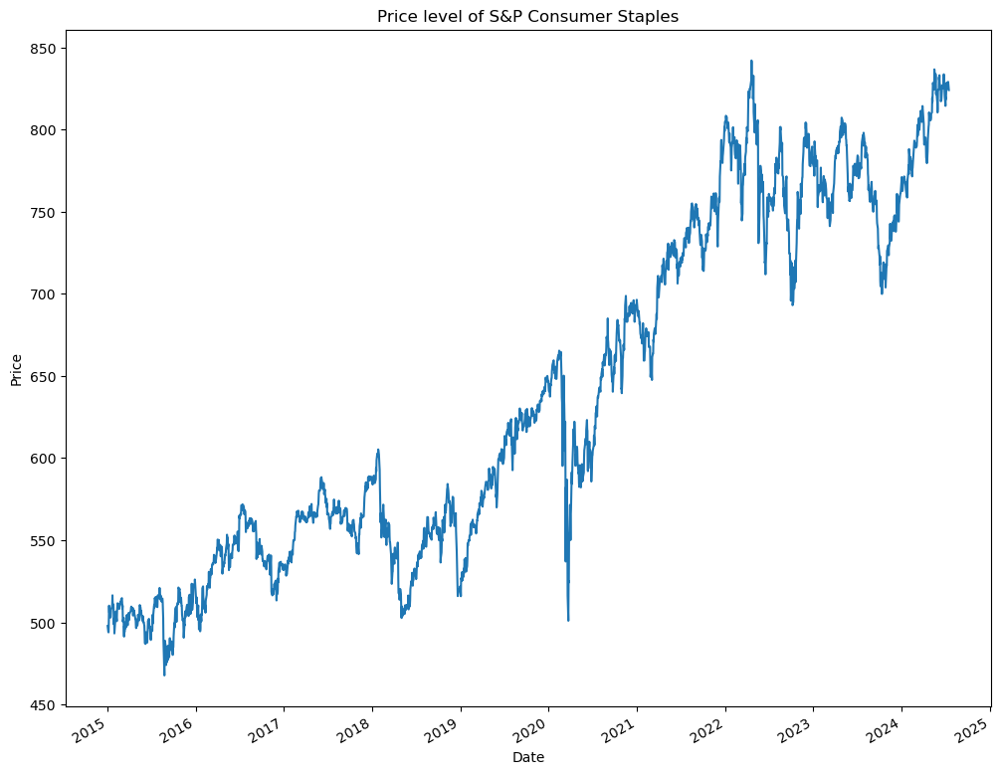

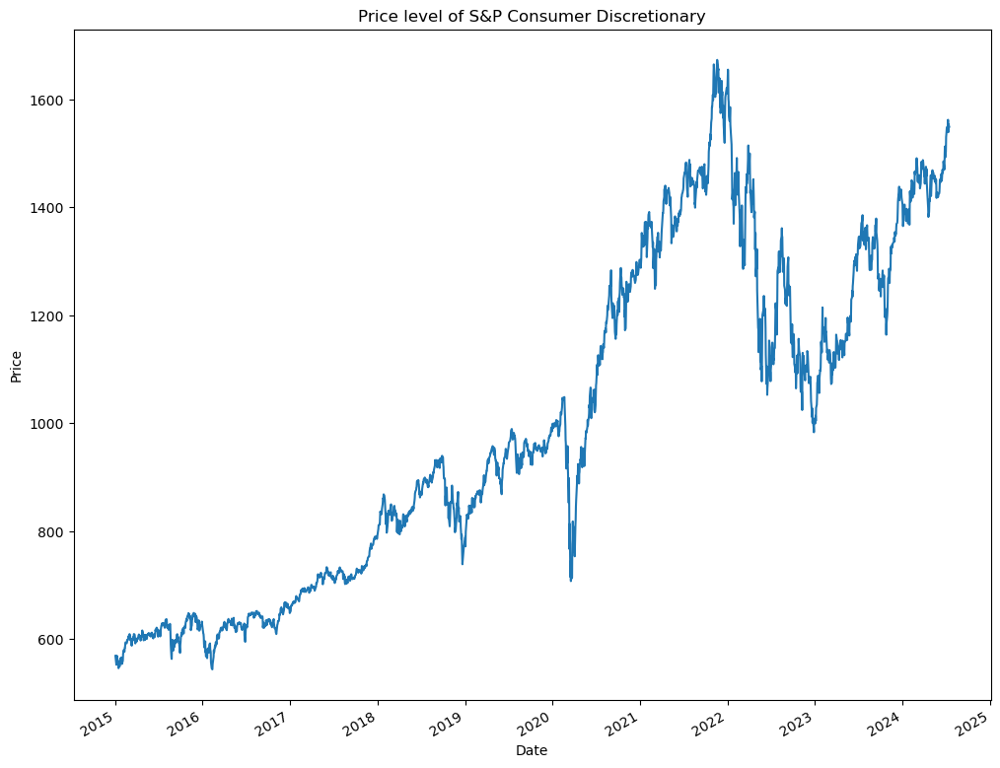

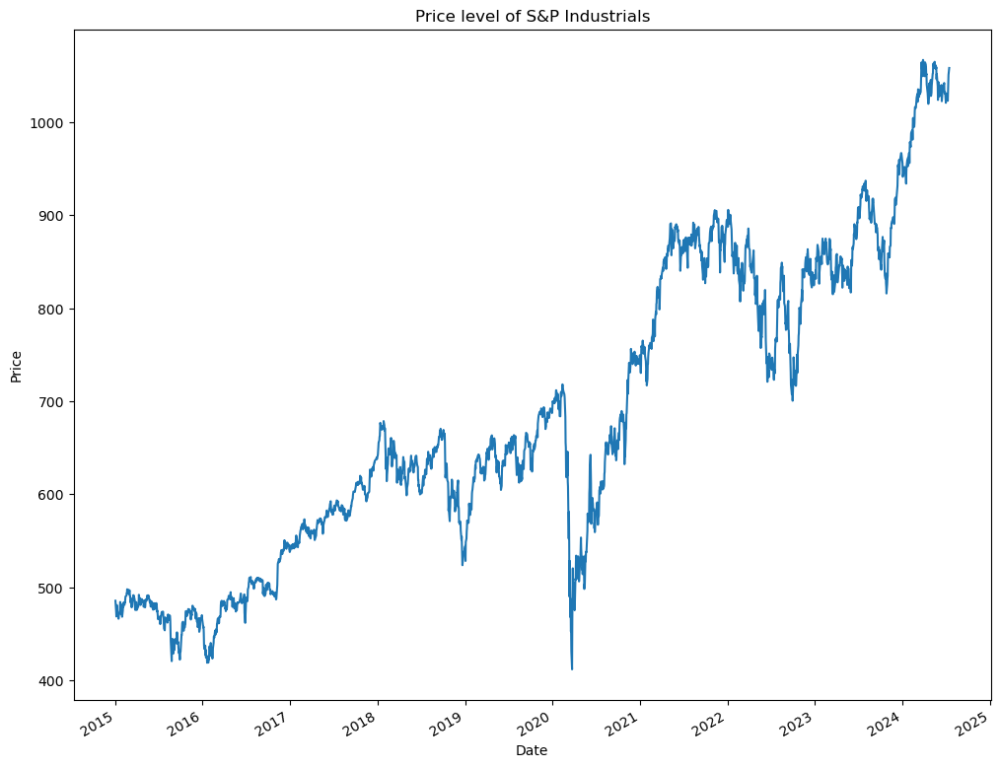

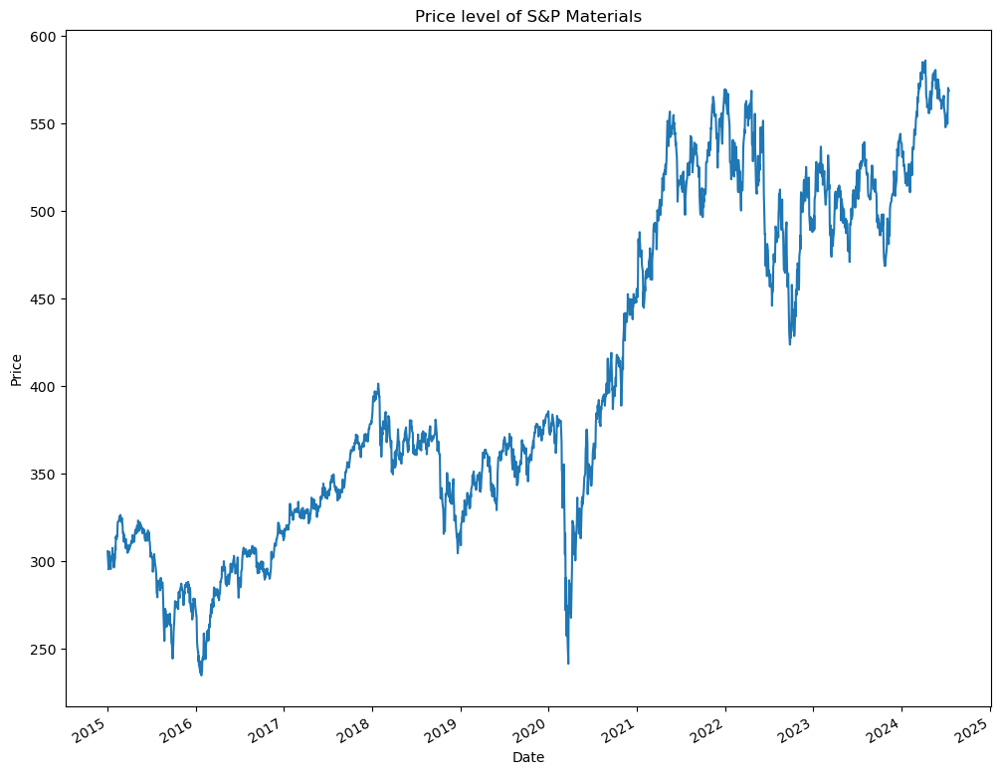

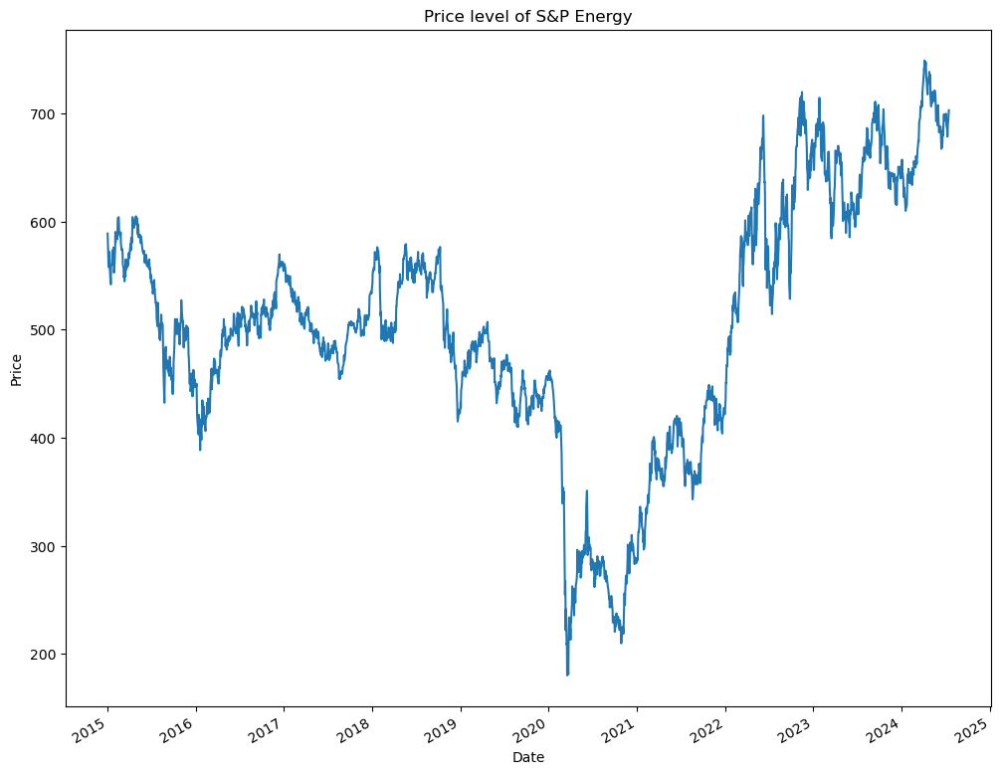

In [443]:
for column in data_filtered.columns:
    plt.figure(figsize=(12, 10)) 
    data_filtered[column].plot(title=f"Price level of {column}")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.grid(False)
    plt.show()

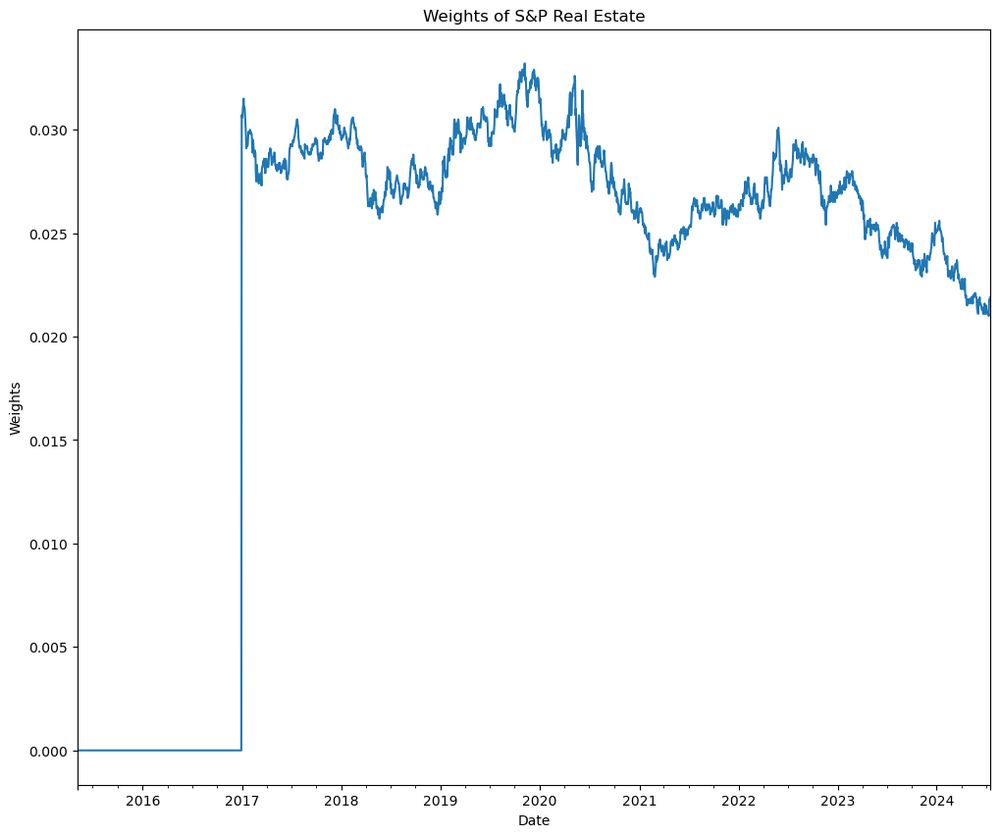

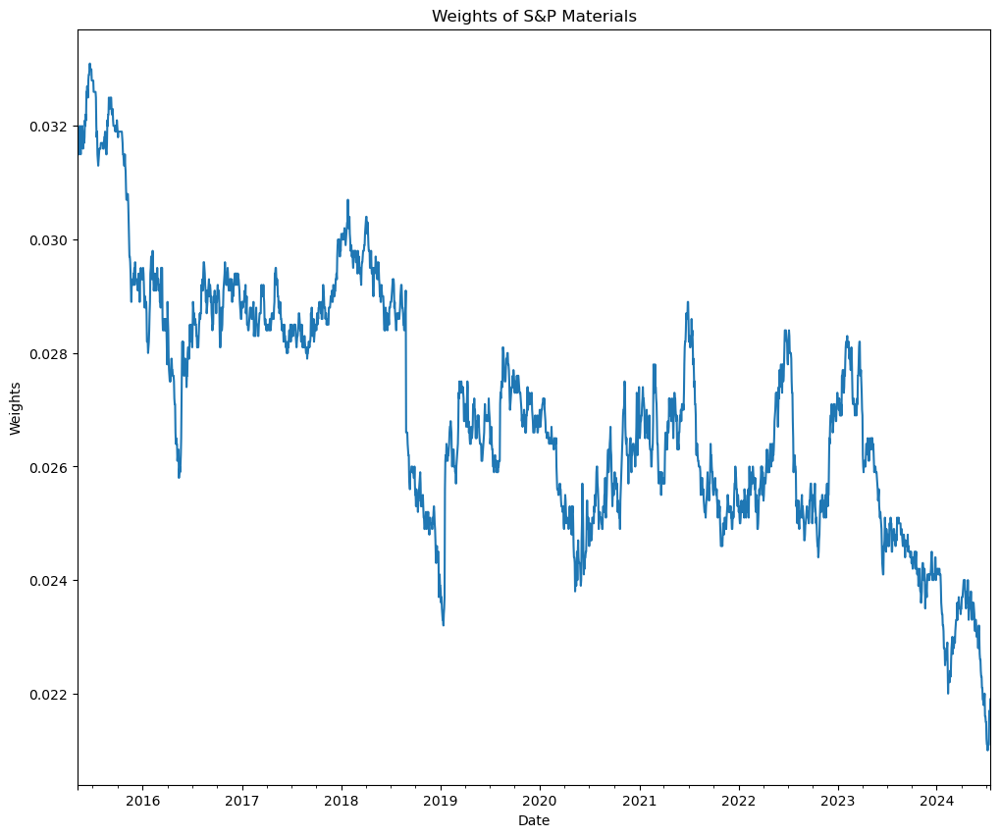

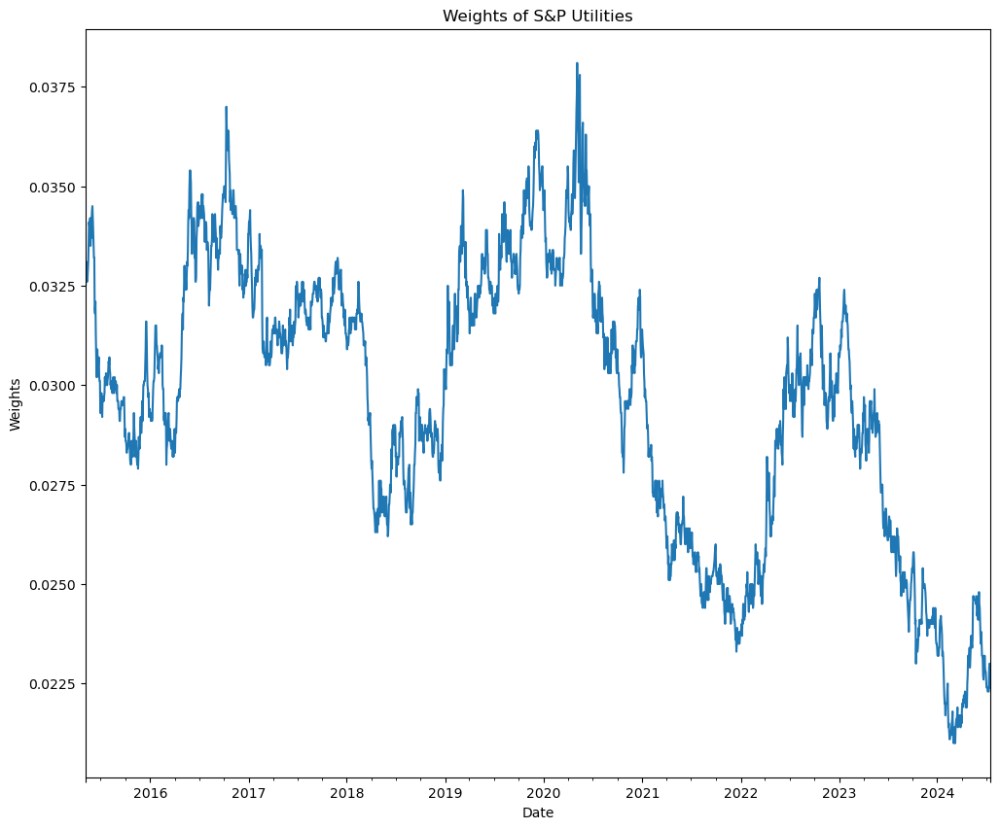

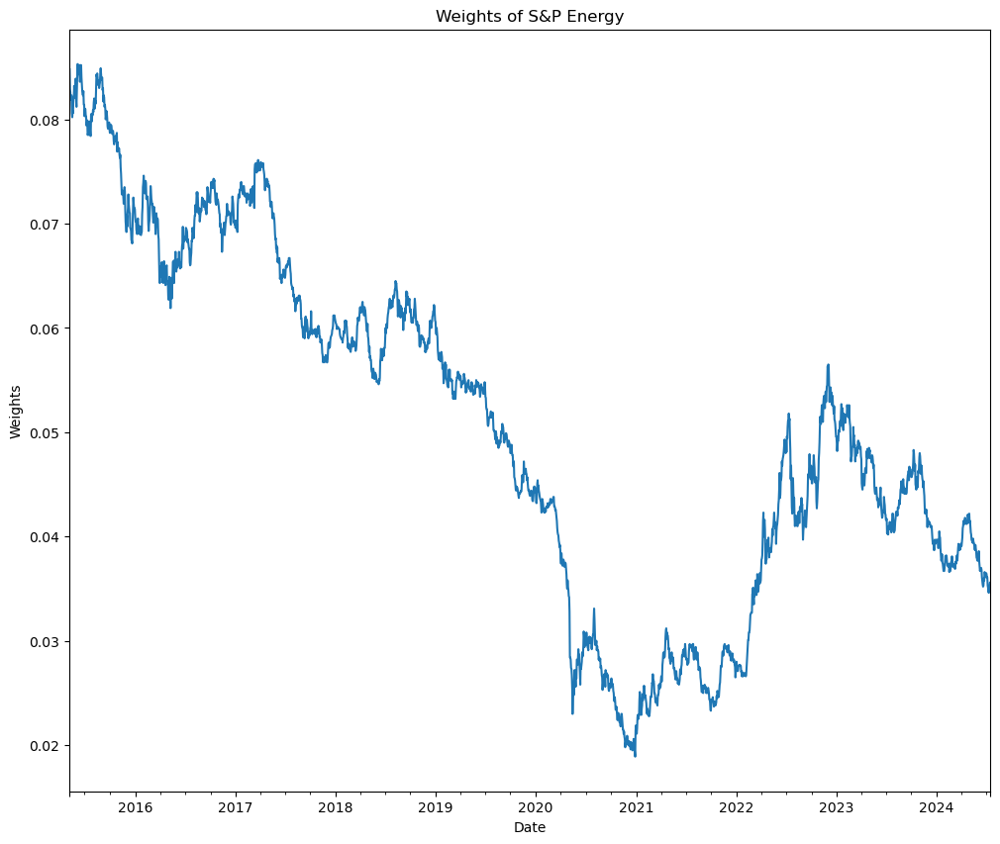

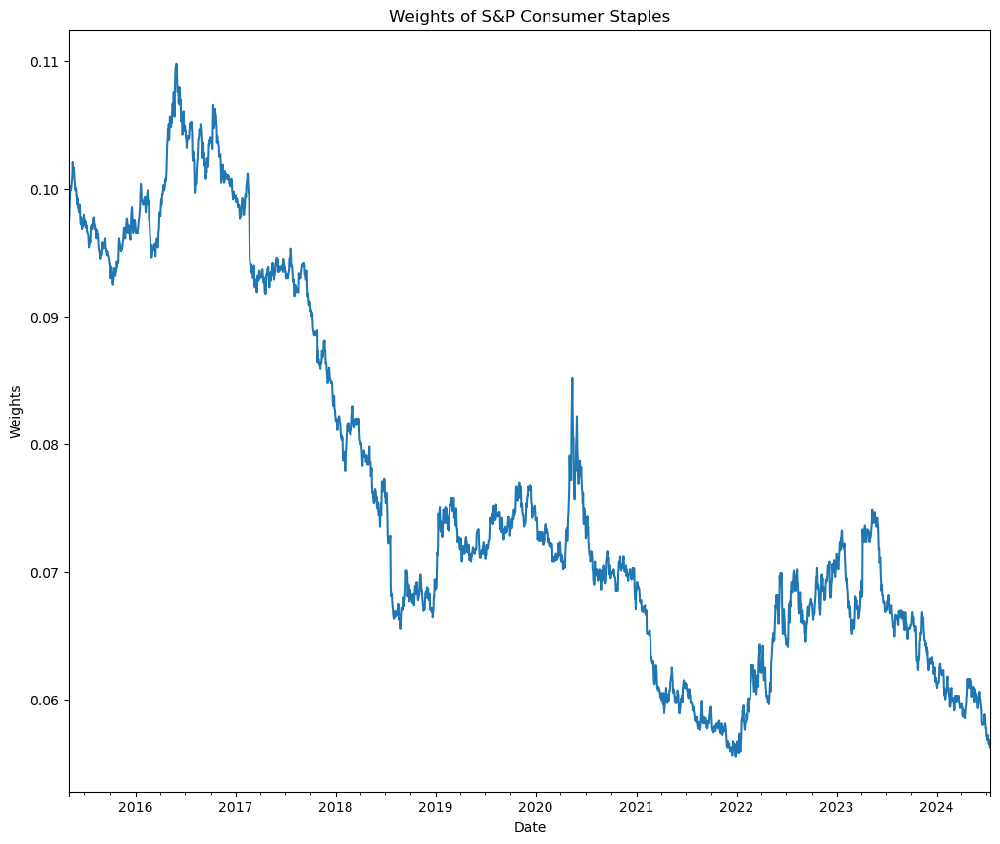

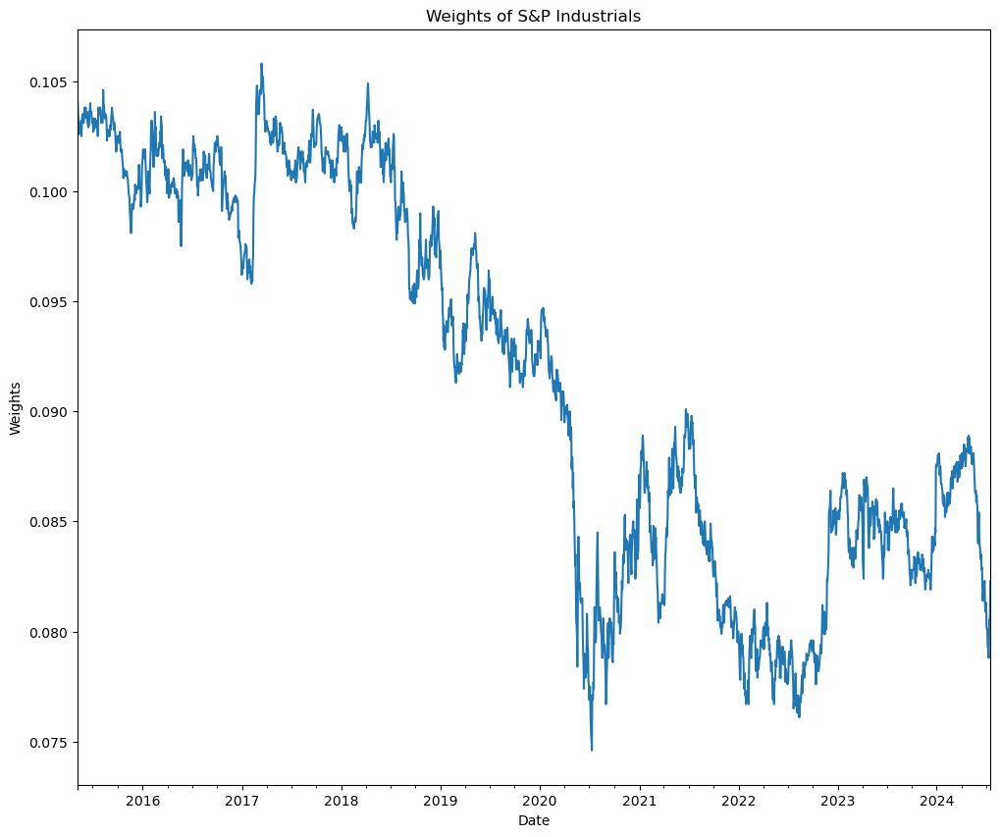

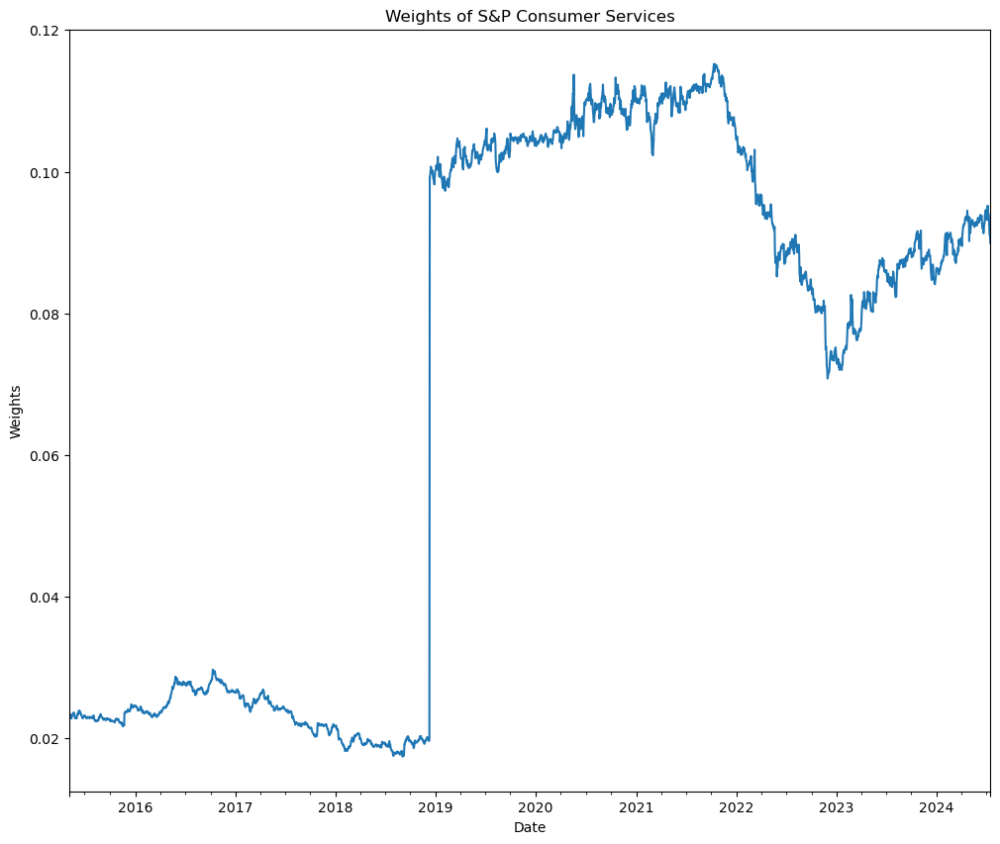

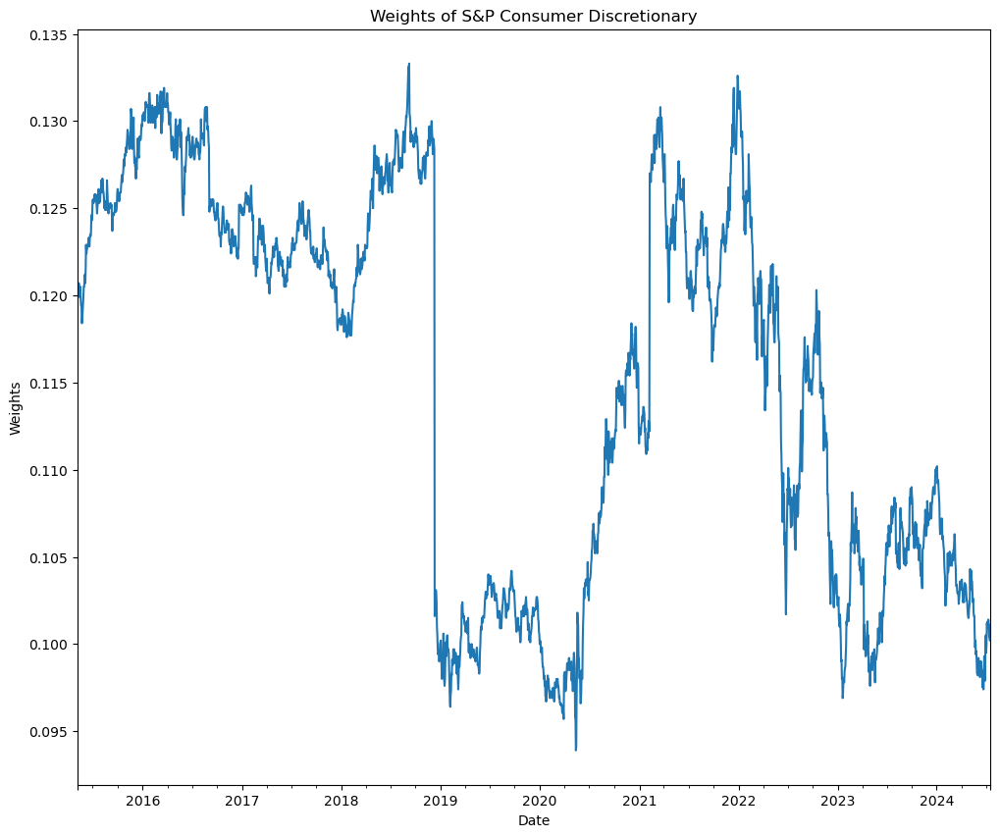

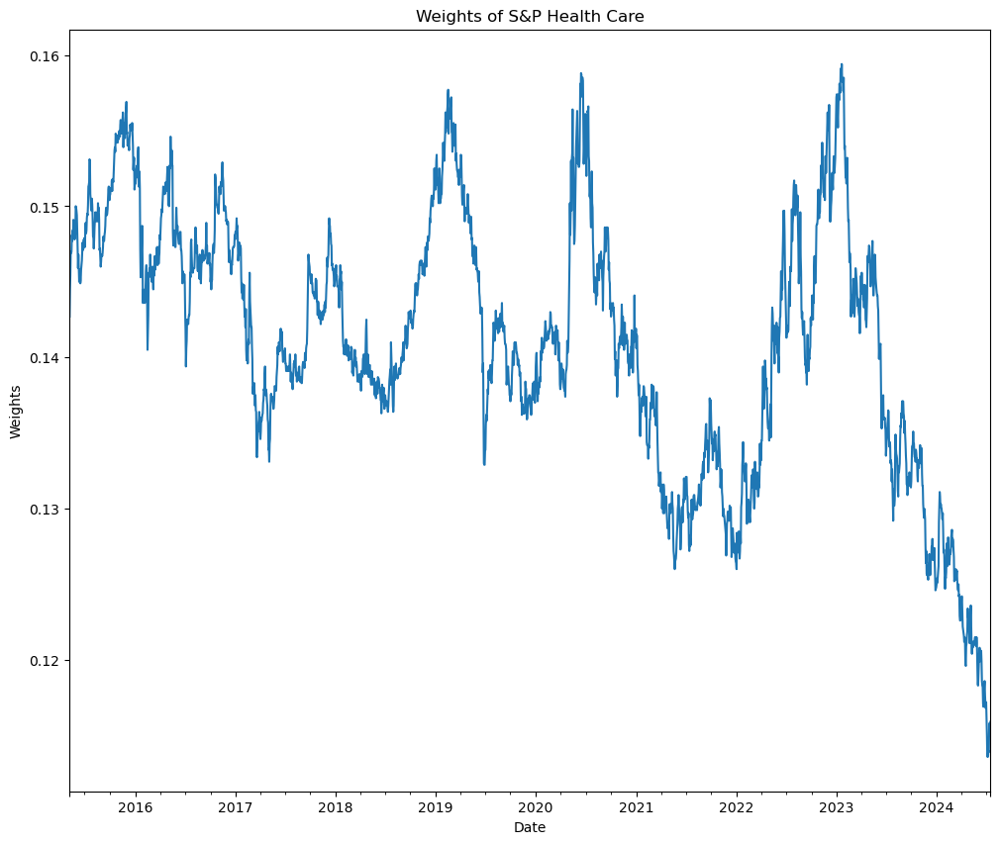

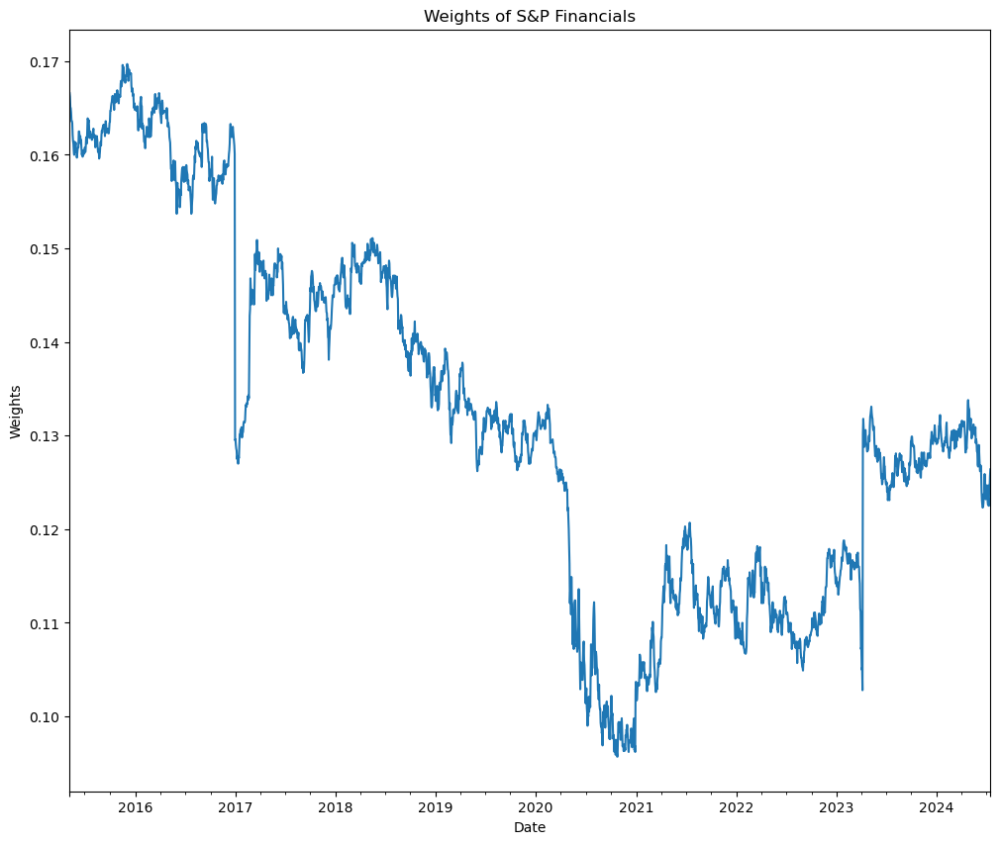

In [444]:
# Ploting varying weights for S&P 500 sectors

for column in data_weights_index.columns:
    plt.figure(figsize=(12, 10)) 
    data_weights_index[column].plot(title=f"Weights of {column}")
    plt.xlabel("Date")
    plt.ylabel("Weights")
    plt.grid(False)
    plt.show()

## Estimation of the rolling OLS betas for the Amundi S&P 500 UCITS ETF vs S&P 500 sectors

### Estimation of the rolling OLS using arithmetic returns (regression of fund returns with respect to market factors)

In [445]:
def rolling_ols(arith_returns, window_size):
    betas = pd.DataFrame(index=arith_returns.index[window_size:], columns=arith_returns.columns[1:])
    for end in range(window_size, len(arith_returns)):
        y = arith_returns.iloc[end-window_size:end, 0]  
        X = arith_returns.iloc[end-window_size:end, 1:] 
        X = sm.add_constant(X)
        model = sm.OLS(y, X).fit()
        betas.iloc[end - window_size] = model.params[1:]
    return betas

window_size = 252
rolling_betas = rolling_ols(arith_returns, window_size)
print("Rolling OLS Betas:\n", rolling_betas.tail())

Rolling OLS Betas:
            S&P Real Estate S&P Utilities S&P Consumer Services  \
Date                                                             
2024-07-09        0.038842     -0.042154              0.094781   
2024-07-10        0.038283     -0.041456              0.094864   
2024-07-11         0.03898     -0.041955                0.0952   
2024-07-12        0.046689     -0.047421              0.094005   
2024-07-15        0.045774     -0.047098              0.091187   

           S&P Information Technology S&P Financials S&P Health Care  \
Date                                                                   
2024-07-09                    0.17865       0.097505        0.078786   
2024-07-10                   0.178935       0.099755         0.08229   
2024-07-11                   0.177496       0.102067        0.079341   
2024-07-12                    0.17968       0.101014        0.069371   
2024-07-15                   0.180752       0.098743        0.070573   

           S

In [446]:
rolling_betas.rename(columns=new_mapping, inplace=True)

In [ ]:
plt.figure(figsize=(12, 10))
plt.plot(rolling_betas.index, rolling_betas, label='Rolling OLS betas')
plt.title('Rolling OLS estimation of Amundi S&P500 UCITS ETF (AMND S&P 500/d) vs S&P500 sectors')
plt.show()

In [ ]:
# Regression plot 

fund_returns = arith_returns.iloc[:, 0]  

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 16))
axes = axes.flatten() 

for i, column in enumerate(arith_returns.columns[1:]):  
    sector_returns = arith_returns[column]

    axes[i].scatter(fund_returns, sector_returns, color='red', alpha=0.5, label=f'Data for {column}')

    X = sm.add_constant(fund_returns)
    model = sm.OLS(sector_returns, X).fit()
    predictions = model.predict(X)

    
    axes[i].plot(fund_returns, predictions, color='blue', linewidth=2, label='Regression Line')
    axes[i].set_title(f'Regression of fund vs {column}')
    axes[i].set_xlabel('Fund returns')
    axes[i].set_ylabel(f'{column} returns')
    axes[i].legend()
    axes[i].grid(True)

plt.tight_layout()

plt.show()

In [ ]:
for column in rolling_betas.columns:
    plt.figure(figsize=(12, 10))  
    rolling_betas[column].plot(title=f"Rolling OLS estimation of Amundi S&P500 UCITS ETF (AMND S&P 500/d) vs {column}")
    plt.xlabel("Date")
    plt.ylabel("Beta")
    plt.grid(False)
    plt.show()

rolling_betas.to_csv('rolling_ols_betas.csv')

In [450]:
def plot_OLS_betas_with_market_weights(rolling_betas, data_weights_index):
    for column in rolling_betas.columns:
        fig, ax1 = plt.subplots(figsize=(12, 8))
        
        color = 'tab:red'
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Beta', color=color)
        ax1.plot(rolling_betas.index, rolling_betas[column], label=f'OLS beta: {column}', color=color, linestyle='--')
        ax1.tick_params(axis='y', labelcolor=color)
        
        if column in data_weights_index.columns:
            ax2 = ax1.twinx()  
            color = 'tab:green'
            ax2.set_ylabel('Weight', color=color)  
            ax2.plot(data_weights_index.index, data_weights_index[column], label=f'Market weight: {column}', color=color)
            ax2.tick_params(axis='y', labelcolor=color)
            ax2.legend(loc='upper right')
        else:
            print(f"Warning: '{column}' not found in market weights data.")
        
        ax1.legend(loc='upper left')
        plt.title(f'OLS filter beta estimation vs. Market weight for {column}')
        fig.tight_layout()  
        plt.grid(True)
        plt.show()

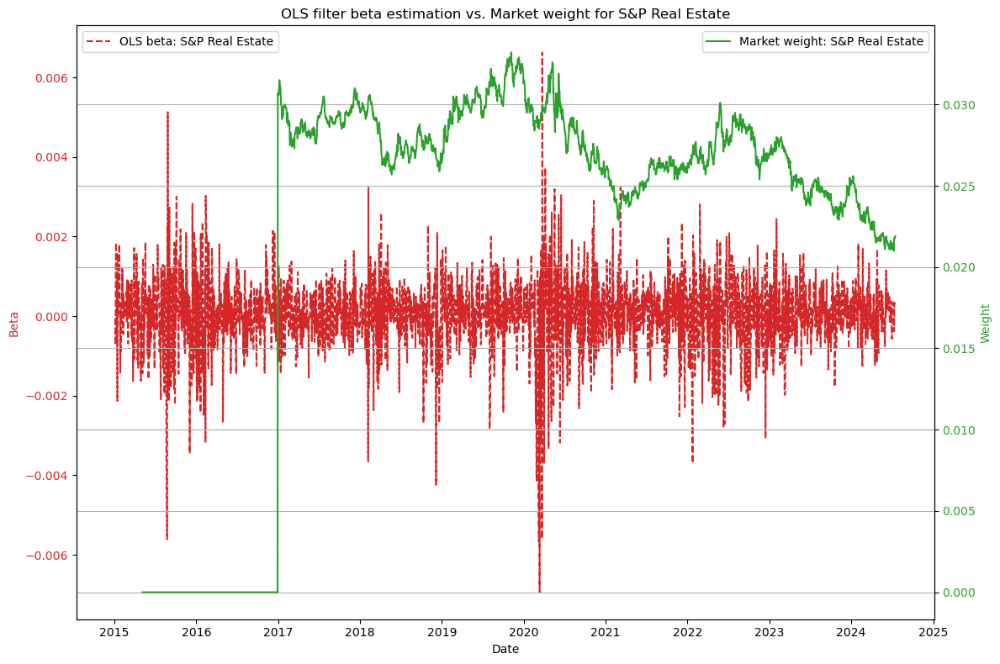

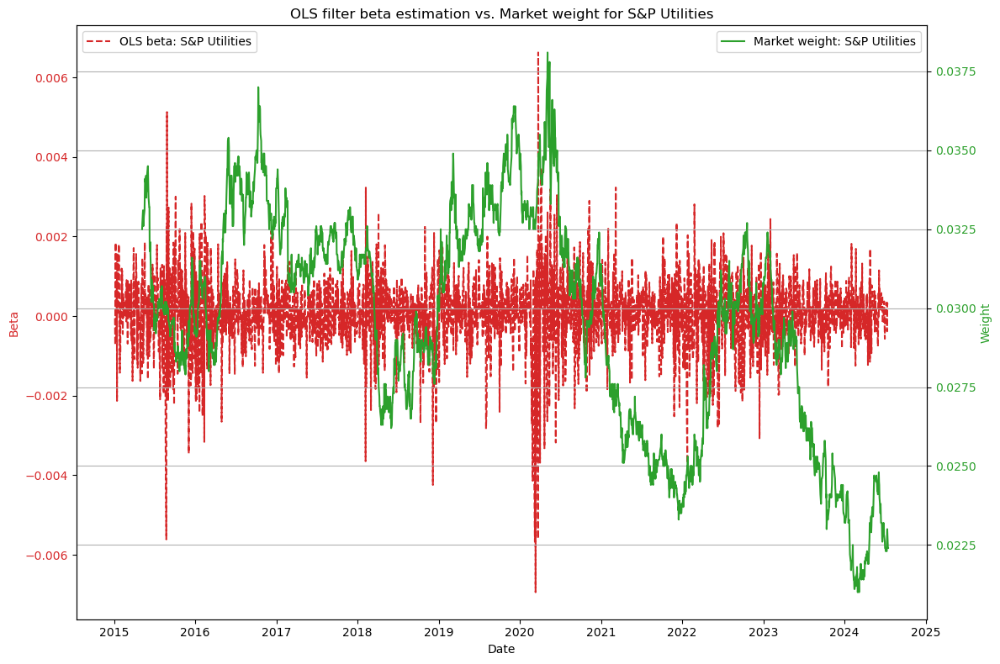

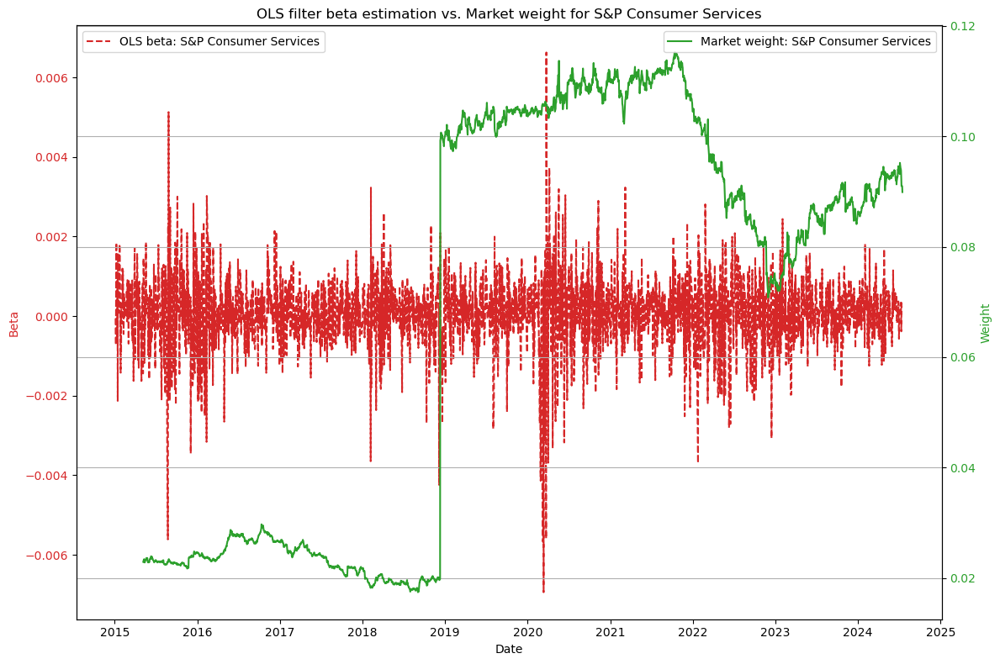

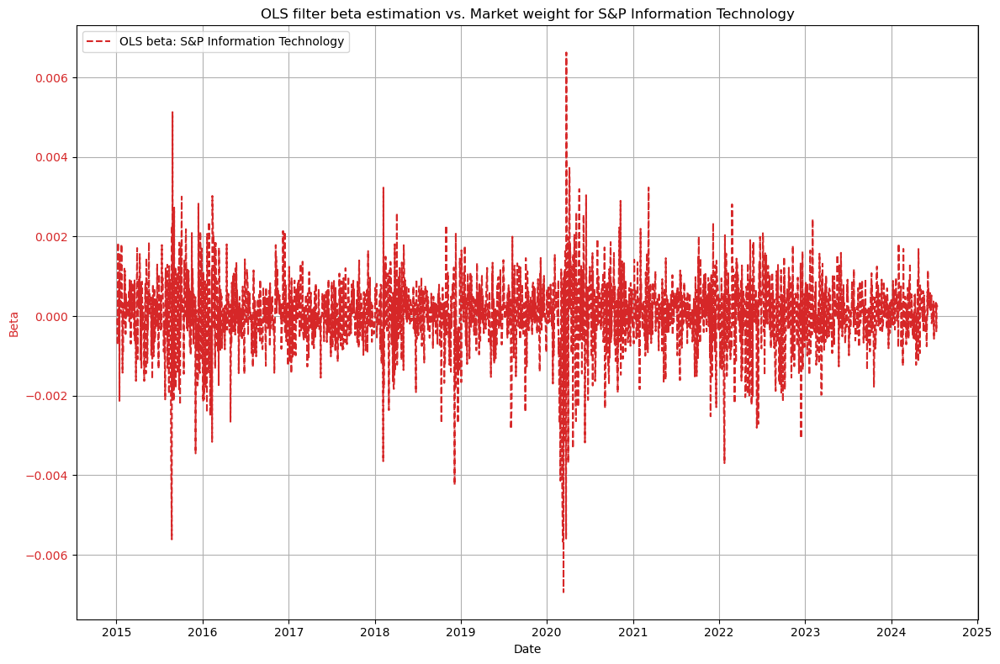

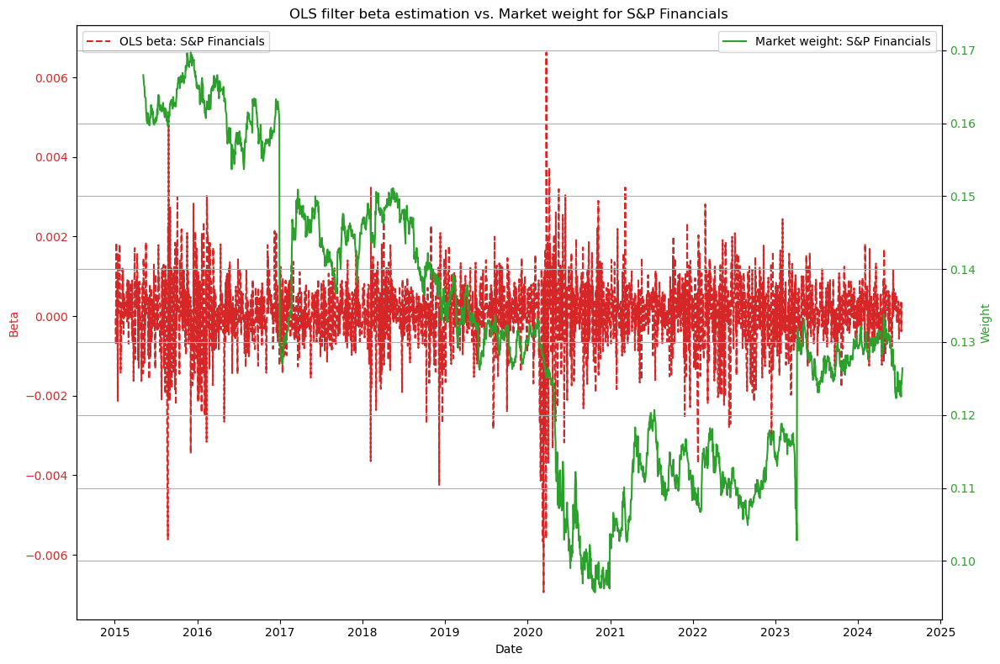

...

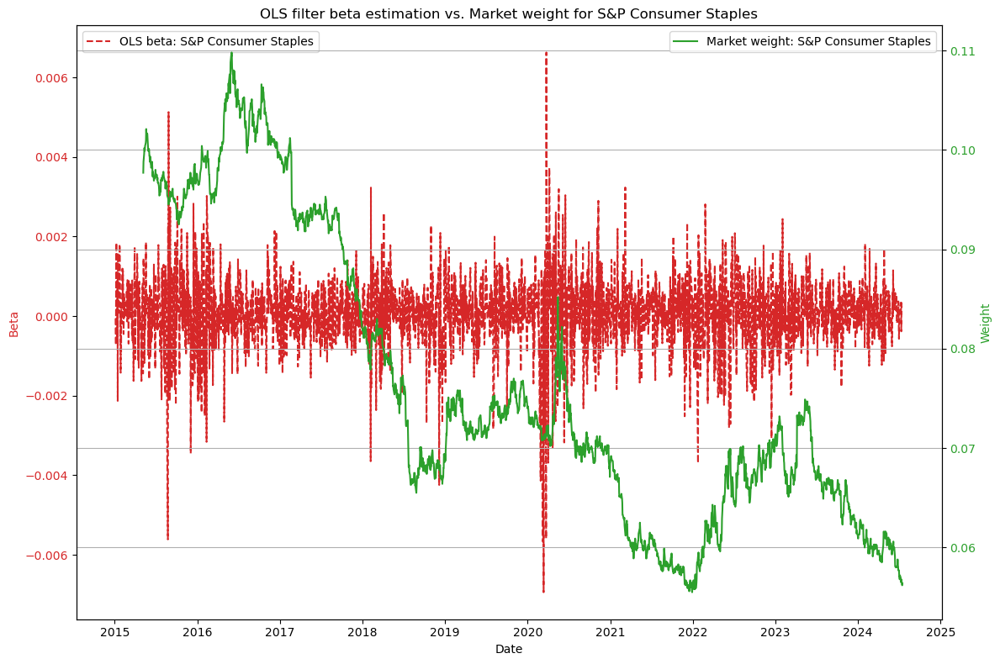

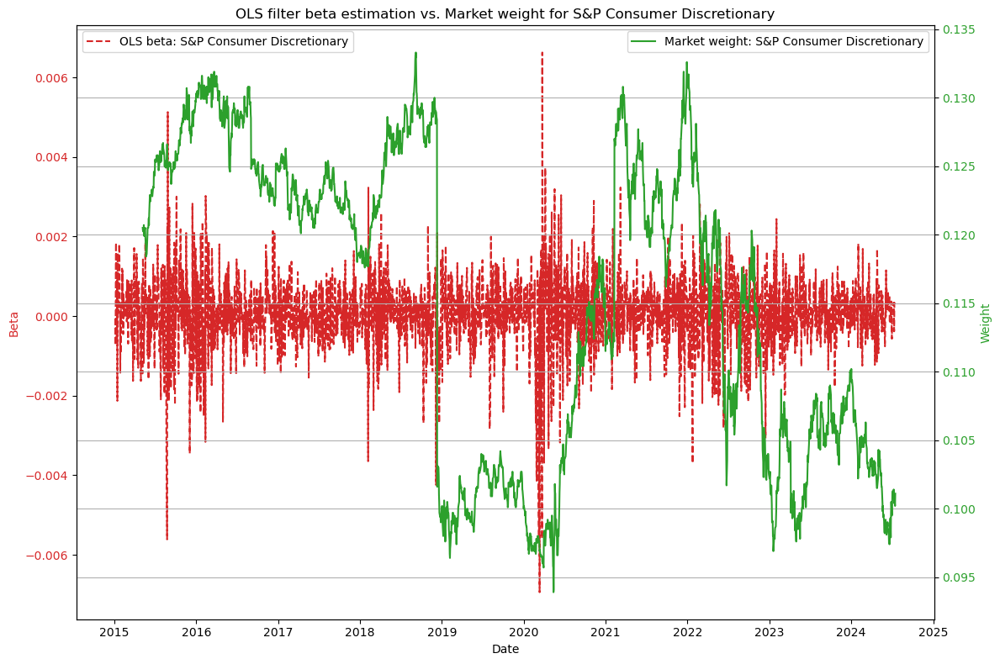

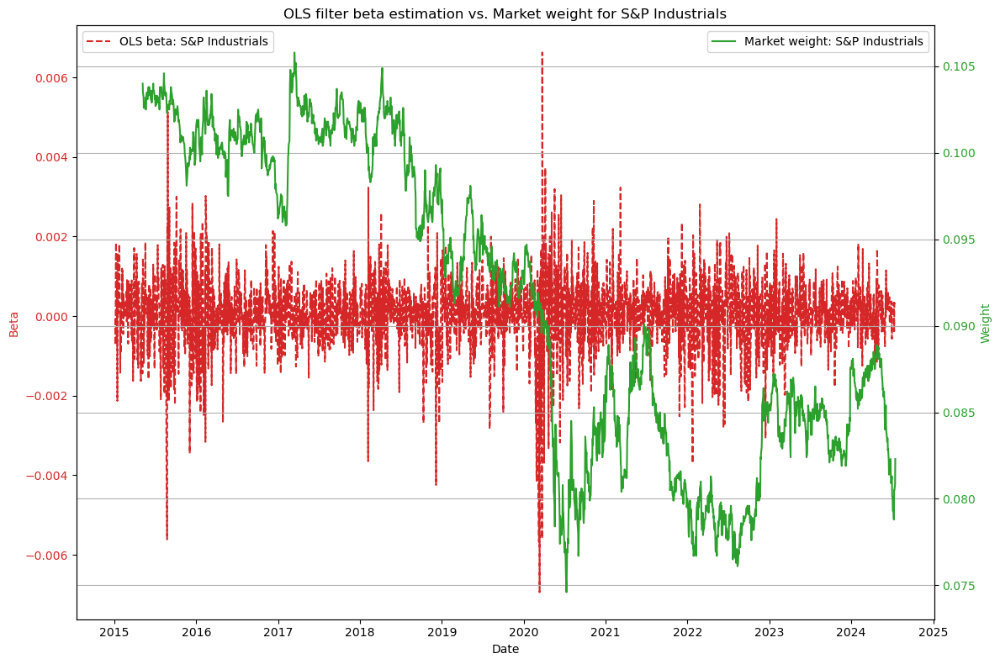

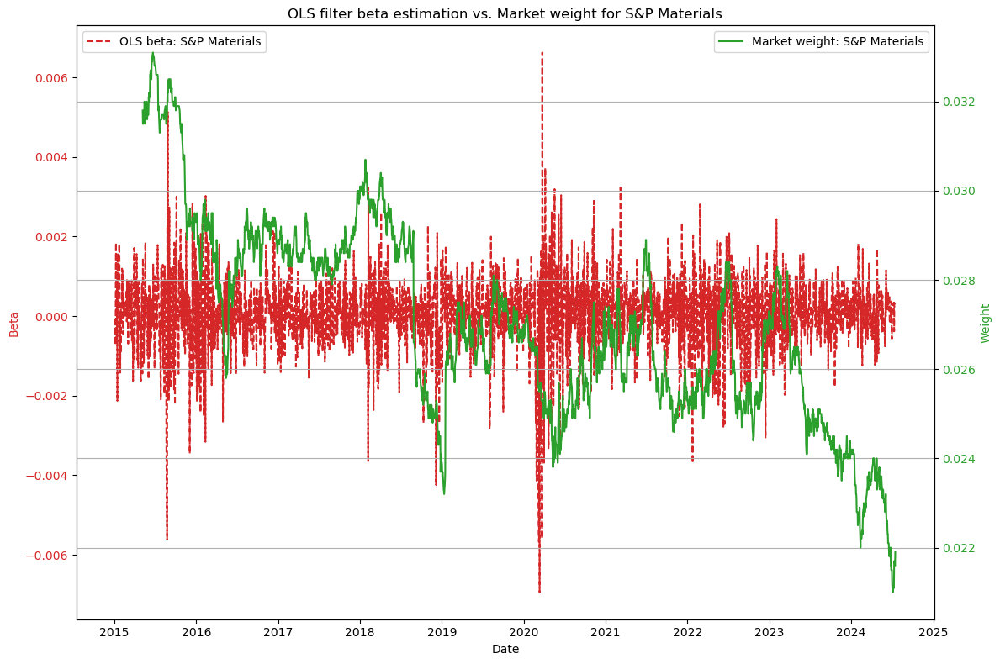

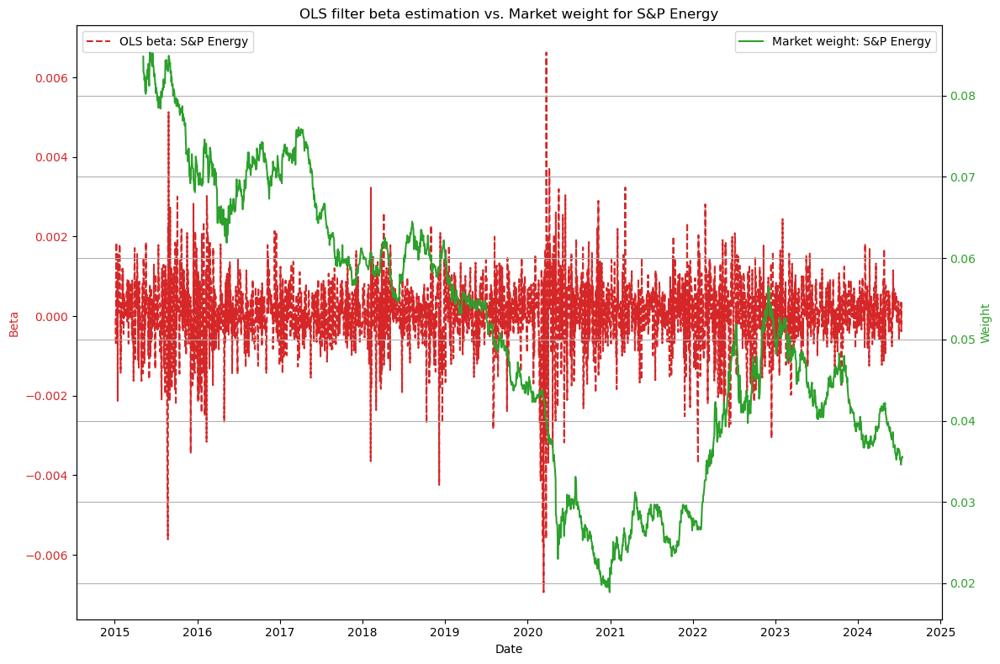

In [451]:
plot_OLS_betas_with_market_weights(filtered_results, data_weights_index)

### Estimation of OLS regression using fund returns with respect to market factor weights

In [452]:
'''
def rolling_ols_weights(regression_data, window_size):
    betas = pd.DataFrame(index=regression_data.index[window_size:], columns=regression_data.columns[1:])
    for end in range(window_size, len(regression_data)):
        y = regression_data.iloc[end-window_size:end, 0]  
        X = regression_data.iloc[end-window_size:end, 1:] 
        X = sm.add_constant(X)
        model = sm.OLS(y, X).fit()
        betas.iloc[end - window_size] = model.params[1:]
    return betas

window_size = 252
rolling_betas_weight = rolling_ols_weights(regression_data, window_size)
print("Rolling OLS Betas:\n", rolling_betas_weight.tail())
'''

'\ndef rolling_ols_weights(regression_data, window_size):\n    betas = pd.DataFrame(index=regression_data.index[window_size:], columns=regression_data.columns[1:])\n    for end in range(window_size, len(regression_data)):\n        y = regression_data.iloc[end-window_size:end, 0]  \n        X = regression_data.iloc[end-window_size:end, 1:] \n        X = sm.add_constant(X)\n        model = sm.OLS(y, X).fit()\n        betas.iloc[end - window_size] = model.params[1:]\n    return betas\n\nwindow_size = 252\nrolling_betas_weight = rolling_ols_weights(regression_data, window_size)\nprint("Rolling OLS Betas:\n", rolling_betas_weight.tail())\n'

In [453]:
'''
plt.figure(figsize=(12, 10))
plt.plot(rolling_betas_weight.index, rolling_betas_weight, label='Rolling OLS betas of weights')
plt.title('Rolling OLS estimation of Amundi S&P500 UCITS ETF (AMND S&P 500/d) vs S&P500 sectors')
plt.show()
'''

"\nplt.figure(figsize=(12, 10))\nplt.plot(rolling_betas_weight.index, rolling_betas_weight, label='Rolling OLS betas of weights')\nplt.title('Rolling OLS estimation of Amundi S&P500 UCITS ETF (AMND S&P 500/d) vs S&P500 sectors')\nplt.show()\n"

In [454]:
'''
for column in rolling_betas_weight.columns:
    plt.figure(figsize=(12, 10))  
    rolling_betas_weight[column].plot(title=f"Rolling OLS weight estimation of Amundi S&P500 UCITS ETF (AMND S&P 500/d) vs {column}")
    plt.xlabel("Date")
    plt.ylabel("Beta")
    plt.grid(False)
    plt.show()

rolling_betas_weight.to_csv('rolling_ols_betas_weight.csv')
'''

'\nfor column in rolling_betas_weight.columns:\n    plt.figure(figsize=(12, 10))  \n    rolling_betas_weight[column].plot(title=f"Rolling OLS weight estimation of Amundi S&P500 UCITS ETF (AMND S&P 500/d) vs {column}")\n    plt.xlabel("Date")\n    plt.ylabel("Beta")\n    plt.grid(False)\n    plt.show()\n\nrolling_betas_weight.to_csv(\'rolling_ols_betas_weight.csv\')\n'

In [455]:
'''
def compute_and_plot_r_squared(arith_returns):
    r_squared_values = {}  

    
    for column in arith_returns.columns[1:]: 
        X = sm.add_constant(arith_returns[column])  # Independent variable (Sector returns)
        y = arith_returns.iloc[:, 0]  # Dependent variable (Fund returns)
        
        model = sm.OLS(y, X).fit()  
        r_squared_values[column] = model.rsquared  

    
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(r_squared_values)), list(r_squared_values.values()), align='center', alpha=0.5)
    plt.xticks(range(len(r_squared_values)), list(r_squared_values.keys()), rotation='vertical')
    plt.xlabel('Sector')
    plt.ylabel('R-squared')
    plt.title('R-squared values for regression of fund returns on each sector')
    plt.tight_layout()  
    plt.show()

    return r_squared_values

r_squared_results = compute_and_plot_r_squared(arith_returns)
'''

"\ndef compute_and_plot_r_squared(arith_returns):\n    r_squared_values = {}  \n\n    \n    for column in arith_returns.columns[1:]: \n        X = sm.add_constant(arith_returns[column])  # Independent variable (Sector returns)\n        y = arith_returns.iloc[:, 0]  # Dependent variable (Fund returns)\n        \n        model = sm.OLS(y, X).fit()  \n        r_squared_values[column] = model.rsquared  \n\n    \n    plt.figure(figsize=(10, 6))\n    plt.bar(range(len(r_squared_values)), list(r_squared_values.values()), align='center', alpha=0.5)\n    plt.xticks(range(len(r_squared_values)), list(r_squared_values.keys()), rotation='vertical')\n    plt.xlabel('Sector')\n    plt.ylabel('R-squared')\n    plt.title('R-squared values for regression of fund returns on each sector')\n    plt.tight_layout()  \n    plt.show()\n\n    return r_squared_values\n\nr_squared_results = compute_and_plot_r_squared(arith_returns)\n"

In [456]:
'''
def compute_and_plot_market_r_squared(arith_returns, start_date, end_date):
    
    sp500_index = yf.download('^GSPC', start=start_date, end=end_date)
    sp500_index['Daily Returns'] = sp500_index['Adj Close'].pct_change()

    
    common_dates = arith_returns.index.intersection(sp500_index.index)
    market_returns = sp500_index.loc[common_dates, 'Daily Returns']

    r_squared_values = {}  

    for column in arith_returns.columns[1:]:  
        sector_returns = arith_returns.loc[common_dates, column]
        X = sm.add_constant(sector_returns)  # Independent variable (Sector returns)
        y = market_returns  # Dependent variable (Market returns)
        
        model = sm.OLS(y, X).fit()  
        r_squared_values[column] = model.rsquared  

    # Plotting the R² values
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(r_squared_values)), list(r_squared_values.values()), align='center', alpha=0.5)
    plt.xticks(range(len(r_squared_values)), list(r_squared_values.keys()), rotation='vertical')
    plt.xlabel('Sector')
    plt.ylabel('R-squared')
    plt.title('R-squared values for regression of S&P 500 returns on each sector')
    plt.tight_layout()  
    plt.show()

    return r_squared_values

r_squared_results_market = compute_and_plot_market_r_squared(arith_returns, '2015-05-01', '2024-07-15')
'''

"\ndef compute_and_plot_market_r_squared(arith_returns, start_date, end_date):\n    \n    sp500_index = yf.download('^GSPC', start=start_date, end=end_date)\n    sp500_index['Daily Returns'] = sp500_index['Adj Close'].pct_change()\n\n    \n    common_dates = arith_returns.index.intersection(sp500_index.index)\n    market_returns = sp500_index.loc[common_dates, 'Daily Returns']\n\n    r_squared_values = {}  \n\n    for column in arith_returns.columns[1:]:  \n        sector_returns = arith_returns.loc[common_dates, column]\n        X = sm.add_constant(sector_returns)  # Independent variable (Sector returns)\n        y = market_returns  # Dependent variable (Market returns)\n        \n        model = sm.OLS(y, X).fit()  \n        r_squared_values[column] = model.rsquared  \n\n    # Plotting the R² values\n    plt.figure(figsize=(10, 6))\n    plt.bar(range(len(r_squared_values)), list(r_squared_values.values()), align='center', alpha=0.5)\n    plt.xticks(range(len(r_squared_values)), list(

### Regression performance analysis

In [457]:
'''
def rolling_regression_with_stats(arith_returns, window_size):
    """
    Performs rolling regression and collects key statistics for each regression.

    Args:
    arith_returns (DataFrame): DataFrame containing the fund returns as the first column and factors in subsequent columns.
    window_size (int): The number of periods used for each rolling regression.

    Returns:
    DataFrame: A DataFrame containing the regression statistics for each window.
    """
    # Prepare data for regression, assume the first column is fund returns and the rest are factors
    Y = arith_returns.iloc[:, 0]  # Fund returns
    X = arith_returns.iloc[:, 1:]  # Factor returns
    
    # Add a constant to the factors for OLS
    X = sm.add_constant(X)
    
    print(X)
    
    # Initialize DataFrame to store results
    results = pd.DataFrame(columns=['Date', 'R_squared', 'Adj_R_squared', 'p_values'])

    # Loop over each period starting from window_size to the length of the data
    for end in range(window_size, len(arith_returns)):
        # Regression on the past window_size data points
        model = sm.OLS(Y.iloc[end-window_size:end], X.iloc[end-window_size:end]).fit()
        
        # Collect the desired statistics
        stats = {
            'Date': arith_returns.index[end],
            'R_squared': model.rsquared,
            'Adj_R_squared': model.rsquared_adj,
            'p_values': model.pvalues
        }
        
        # Append the stats to the results DataFrame
        results = results
    
    # Setting the date as index
    results.set_index('Date', inplace=True)
    return results


window_size = 252  
regression_stats = rolling_regression_with_stats(arith_returns, window_size)

# Print the results DataFrame to see the regression statistics
print(regression_stats.tail())
print(regression_stats.info())
'''


'\ndef rolling_regression_with_stats(arith_returns, window_size):\n    """\n    Performs rolling regression and collects key statistics for each regression.\n\n    Args:\n    arith_returns (DataFrame): DataFrame containing the fund returns as the first column and factors in subsequent columns.\n    window_size (int): The number of periods used for each rolling regression.\n\n    Returns:\n    DataFrame: A DataFrame containing the regression statistics for each window.\n    """\n    # Prepare data for regression, assume the first column is fund returns and the rest are factors\n    Y = arith_returns.iloc[:, 0]  # Fund returns\n    X = arith_returns.iloc[:, 1:]  # Factor returns\n    \n    # Add a constant to the factors for OLS\n    X = sm.add_constant(X)\n    \n    print(X)\n    \n    # Initialize DataFrame to store results\n    results = pd.DataFrame(columns=[\'Date\', \'R_squared\', \'Adj_R_squared\', \'p_values\'])\n\n    # Loop over each period starting from window_size to the leng

In [458]:
'''
def compute_estimated_returns(arith_returns, rolling_betas_weight, fund_col):
    
    """
    Compute estimated returns from rolling betas.

    Args:
    data (DataFrame): DataFrame containing return data.
    betas (DataFrame): DataFrame containing rolling beta estimates.
    fund_col (str): Column name of the fund returns used for actual returns.

    Returns:
    Series: A pandas Series containing the estimated returns.
    """
    # Initialize an empty series to store the estimated returns
    estimated_returns = pd.Series(index=arith_returns.index[window_size:], dtype=float)

    # Loop over the dates for which betas are available
    for date, params in rolling_betas_weight.iterrows():
        # Ensure that the current date is within the data's range
        if date in data.index:
            # Select the relevant market factors for the current date from data
            market_factors = data.loc[date, rolling_betas_weight.columns]
            # Calculate the estimated return for this date
            estimated_returns.loc[date] = np.dot(params, market_factors)

    return estimated_returns

fund_col = 'AMND S&P 500/d'
estimated_returns = compute_estimated_returns(arith_returns, rolling_betas, fund_col)
actual_returns = arith_returns[fund_col][window_size:]
'''


'\ndef compute_estimated_returns(arith_returns, rolling_betas_weight, fund_col):\n    \n    """\n    Compute estimated returns from rolling betas.\n\n    Args:\n    data (DataFrame): DataFrame containing return data.\n    betas (DataFrame): DataFrame containing rolling beta estimates.\n    fund_col (str): Column name of the fund returns used for actual returns.\n\n    Returns:\n    Series: A pandas Series containing the estimated returns.\n    """\n    # Initialize an empty series to store the estimated returns\n    estimated_returns = pd.Series(index=arith_returns.index[window_size:], dtype=float)\n\n    # Loop over the dates for which betas are available\n    for date, params in rolling_betas_weight.iterrows():\n        # Ensure that the current date is within the data\'s range\n        if date in data.index:\n            # Select the relevant market factors for the current date from data\n            market_factors = data.loc[date, rolling_betas_weight.columns]\n            # Calcul

In [459]:
'''
r_squared = r2_score(actual_returns, estimated_returns.dropna()) 
print(f'R-squared: {r_squared}')
'''

"\nr_squared = r2_score(actual_returns, estimated_returns.dropna()) \nprint(f'R-squared: {r_squared}')\n"

In [460]:
'''
mse = mean_squared_error(actual_returns, estimated_returns)
rmse = np.sqrt(mse)
mae = mean_absolute_error(actual_returns, estimated_returns)
r_squared = r2_score(actual_returns, estimated_returns)

print(f"R-squared: {r_squared}")
print(f"RMSE: {rmse}")
print(f"MAE: {mae}")
print(f"MSE: {mse}")
'''

'\nmse = mean_squared_error(actual_returns, estimated_returns)\nrmse = np.sqrt(mse)\nmae = mean_absolute_error(actual_returns, estimated_returns)\nr_squared = r2_score(actual_returns, estimated_returns)\n\nprint(f"R-squared: {r_squared}")\nprint(f"RMSE: {rmse}")\nprint(f"MAE: {mae}")\nprint(f"MSE: {mse}")\n'

In [461]:
'''
plt.figure(figsize=(12, 10))
plt.plot(actual_returns.index, actual_returns, label='Actual returns', color='blue')
plt.plot(estimated_returns.index, estimated_returns, label='Estimated returns', color='red')
plt.title('Comparison of actual vs. estimated Amundi S&P500 UCITS ETF (AMND S&P 500/d) returns')
plt.xlabel('Date')
plt.ylabel('Returns')
plt.legend()
plt.show()
'''

"\nplt.figure(figsize=(12, 10))\nplt.plot(actual_returns.index, actual_returns, label='Actual returns', color='blue')\nplt.plot(estimated_returns.index, estimated_returns, label='Estimated returns', color='red')\nplt.title('Comparison of actual vs. estimated Amundi S&P500 UCITS ETF (AMND S&P 500/d) returns')\nplt.xlabel('Date')\nplt.ylabel('Returns')\nplt.legend()\nplt.show()\n"

## Estimation of the Kalman filter betas for the Amundi S&P 500 UCITS ETF vs S&P 500 sectors

In [462]:
def apply_kalman_filter(arith_returns):
    """
    Applies the Kalman Filter to estimate time-varying betas from return time series.

    Args:
        arith_returns (DataFrame): DataFrame containing fund returns and market factor returns.
    
    Returns:
        DataFrame: Estimated beta coefficients for each market factor over time.
    """
    # Define the number of timesteps and factors (assuming the first column is the fund returns)
    n_timesteps, n_factors = arith_returns.shape[0], arith_returns.shape[1] - 1

    # Initialize the Kalman Filter parameters
    initial_state_mean = np.zeros(n_factors)  # State is beta coefficients
    initial_state_covariance = np.ones((n_factors, n_factors)) * 1e-4
    transition_matrices = np.eye(n_factors)
    
    observation_matrices = np.zeros((1, n_factors))  # Observing the fund returns influenced by all factors
    observation_matrices[0, :] = 1  # Assuming linear combination of all factors affects observed returns

    observation_covariance = np.eye(1) * 0.1  # Noise factor
    transition_covariance = np.eye(n_factors) * 0.1  # Small evolutionary changes

    kf = KalmanFilter(
        transition_matrices=transition_matrices,
        observation_matrices=observation_matrices,
        initial_state_mean=initial_state_mean,
        initial_state_covariance=initial_state_covariance,
        observation_covariance=observation_covariance,
        transition_covariance=transition_covariance
    )

    # Extract the observed data, which is the returns of the fund (first column)
    observed_data = arith_returns.iloc[:, 0].values.reshape(-1, 1)  # Ensure it's 2D

    # Apply the filter
    state_means, state_covariances = kf.filter(observed_data)

    return pd.DataFrame(state_means, index=arith_returns.index, columns=arith_returns.columns[1:])

In [463]:
try:
    filtered_results = apply_kalman_filter(arith_returns)
    print(filtered_results.head())
except Exception as e:
    print("Error:", e)

            S&P Real Estate  S&P Utilities  S&P Consumer Services  \
Date                                                                
2015-01-05        -0.000056      -0.000056              -0.000056   
2015-01-06        -0.000729      -0.000729              -0.000729   
2015-01-07         0.001187       0.001187               0.001187   
2015-01-08         0.001842       0.001842               0.001842   
2015-01-09        -0.000627      -0.000627              -0.000627   

            S&P Information Technology  S&P Financials  S&P Health Care  \
Date                                                                      
2015-01-05                   -0.000056       -0.000056        -0.000056   
2015-01-06                   -0.000729       -0.000729        -0.000729   
2015-01-07                    0.001187        0.001187         0.001187   
2015-01-08                    0.001842        0.001842         0.001842   
2015-01-09                   -0.000627       -0.000627        -0.0

In [464]:
print(filtered_results)
print(data_weights_index)

            S&P Real Estate  S&P Utilities  S&P Consumer Services  \
Date                                                                
2015-01-05        -0.000056      -0.000056              -0.000056   
2015-01-06        -0.000729      -0.000729              -0.000729   
2015-01-07         0.001187       0.001187               0.001187   
2015-01-08         0.001842       0.001842               0.001842   
2015-01-09        -0.000627      -0.000627              -0.000627   
...                     ...            ...                    ...   
2024-07-09         0.000336       0.000336               0.000336   
2024-07-10         0.000136       0.000136               0.000136   
2024-07-11        -0.000384      -0.000384              -0.000384   
2024-07-12         0.000333       0.000333               0.000333   
2024-07-15         0.000229       0.000229               0.000229   

            S&P Information Technology  S&P Financials  S&P Health Care  \
Date                       

In [465]:
def plot_kalman_betas_with_market_weights(filtered_results, data_weights_index):
    for column in filtered_results.columns:
        fig, ax1 = plt.subplots(figsize=(12, 8))
        
        color = 'tab:red'
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Beta', color=color)
        ax1.plot(filtered_results.index, filtered_results[column], label=f'Kalman beta: {column}', color=color, linestyle='--')
        ax1.tick_params(axis='y', labelcolor=color)
        
        if column in data_weights_index.columns:
            ax2 = ax1.twinx()  
            color = 'tab:green'
            ax2.set_ylabel('Weight', color=color)  
            ax2.plot(data_weights_index.index, data_weights_index[column], label=f'Market weight: {column}', color=color)
            ax2.tick_params(axis='y', labelcolor=color)
            ax2.legend(loc='upper right')
        else:
            print(f"Warning: '{column}' not found in market weights data.")
        
        ax1.legend(loc='upper left')
        plt.title(f'Kalman filter beta estimation vs. Market weight for {column}')
        fig.tight_layout()  
        plt.grid(True)
        plt.show()

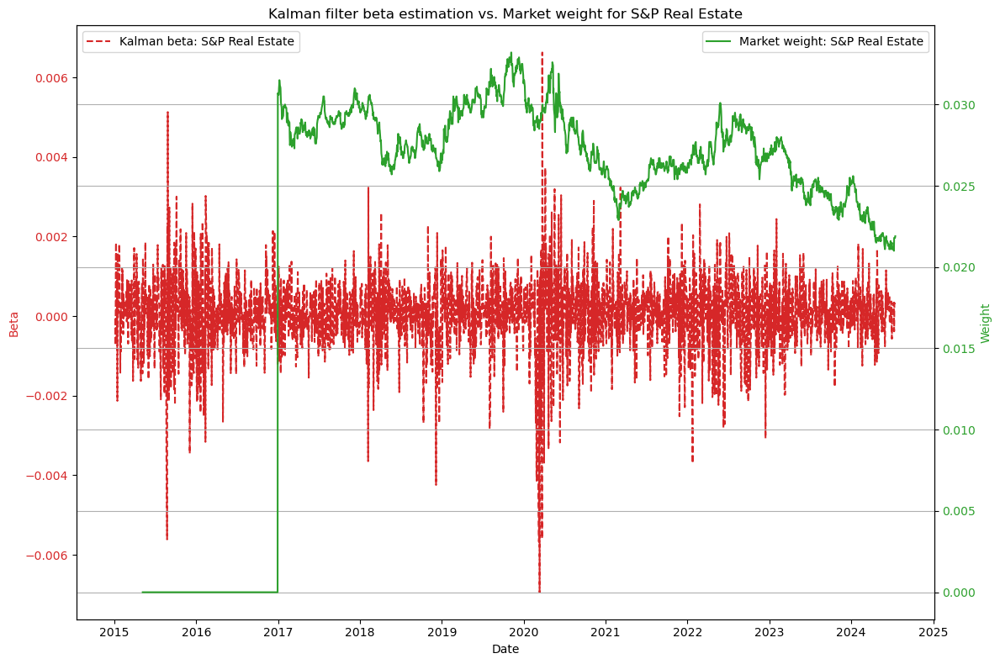

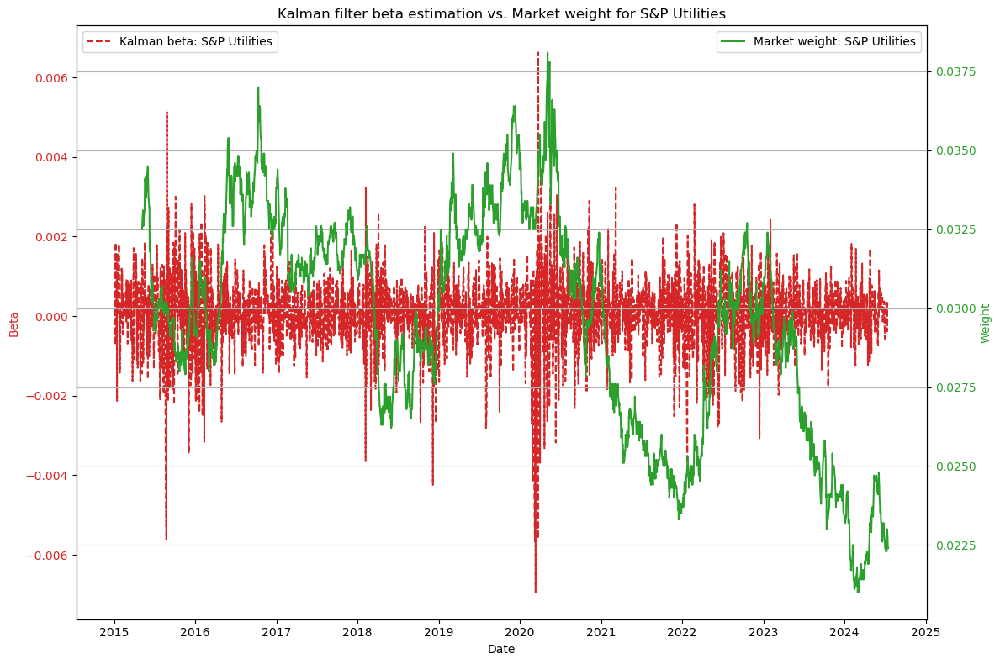

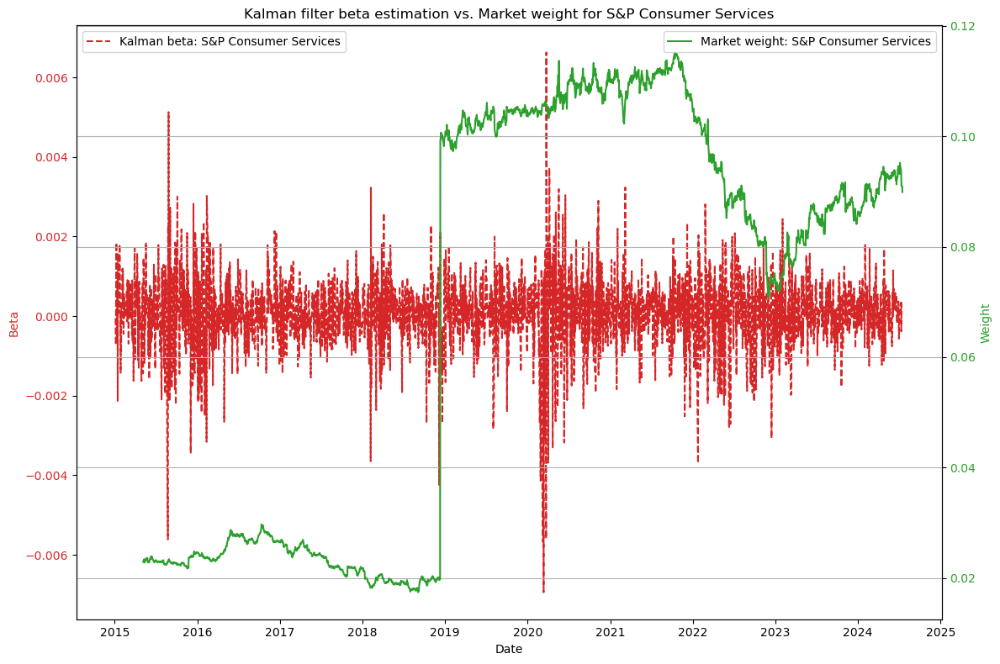

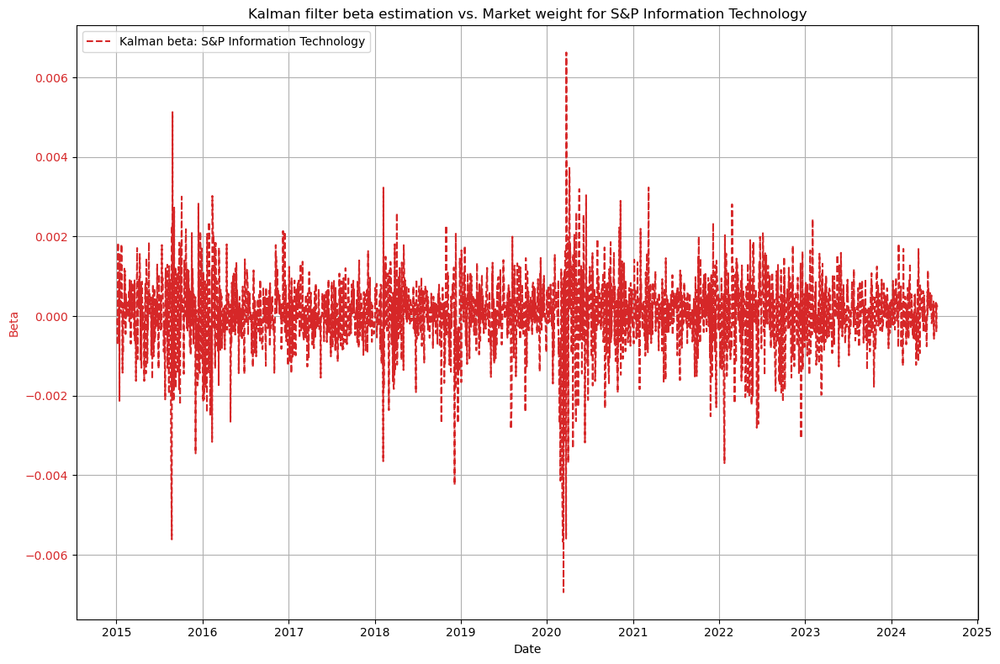

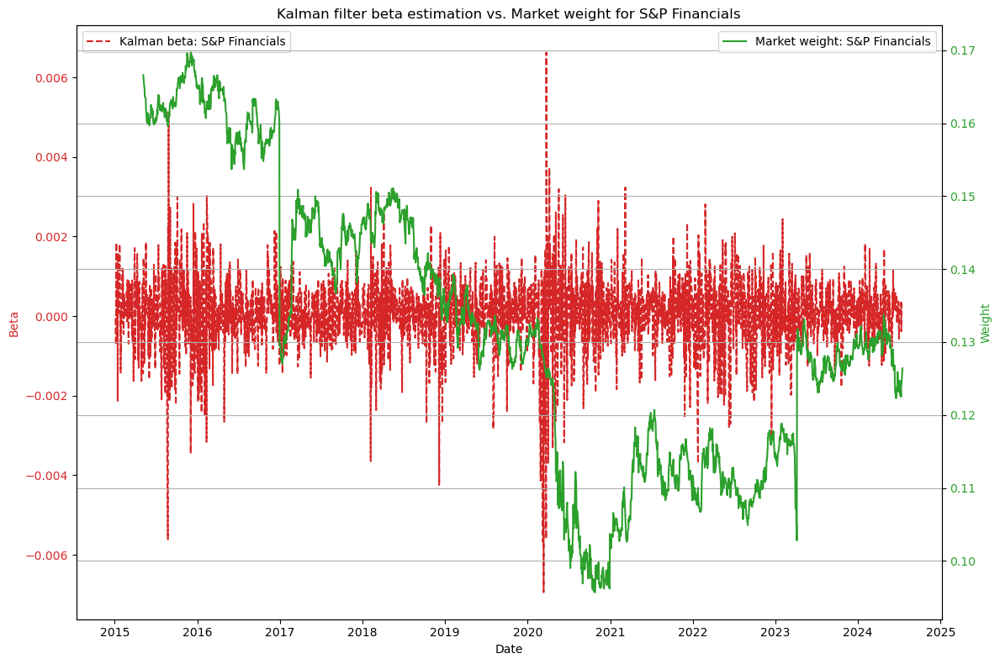

...

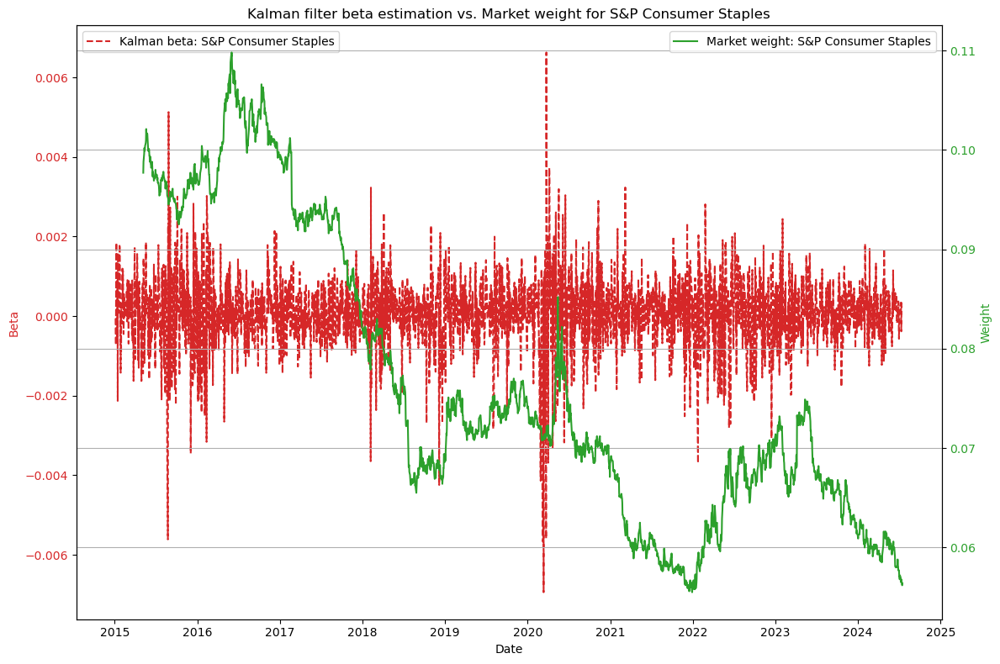

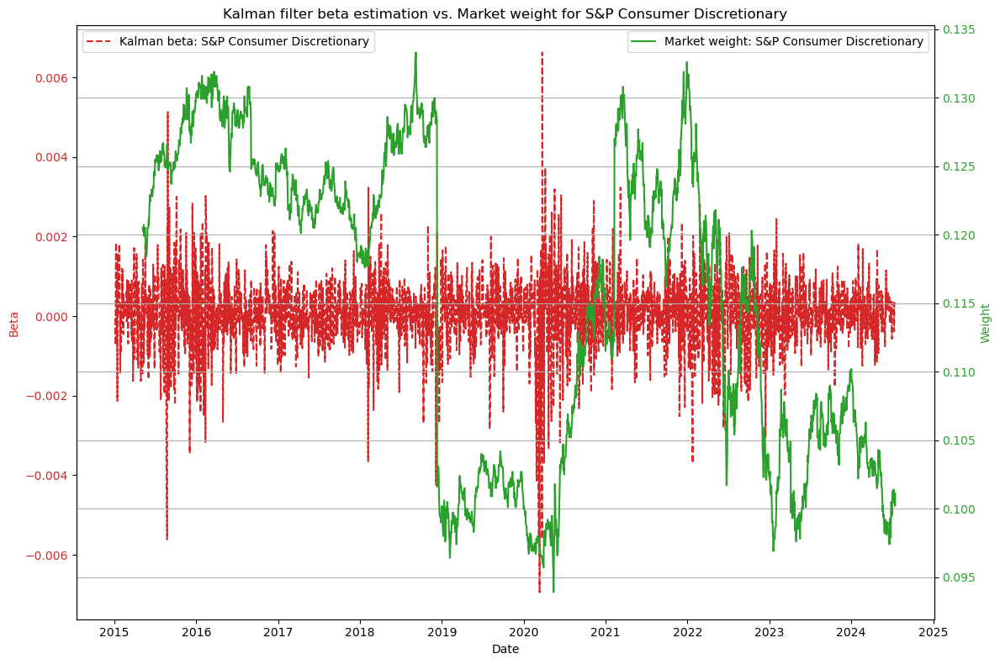

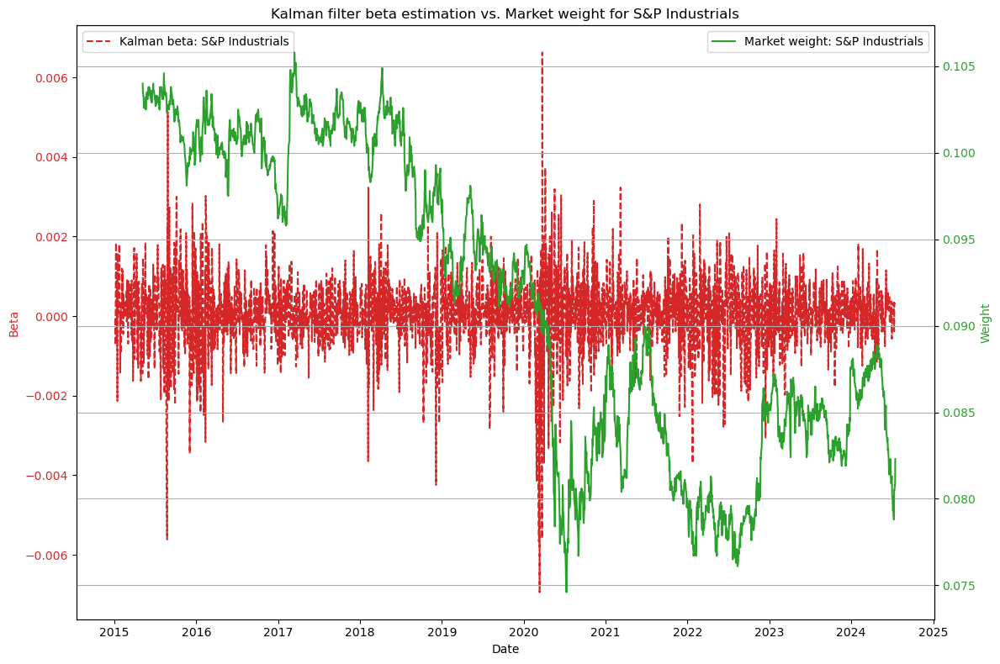

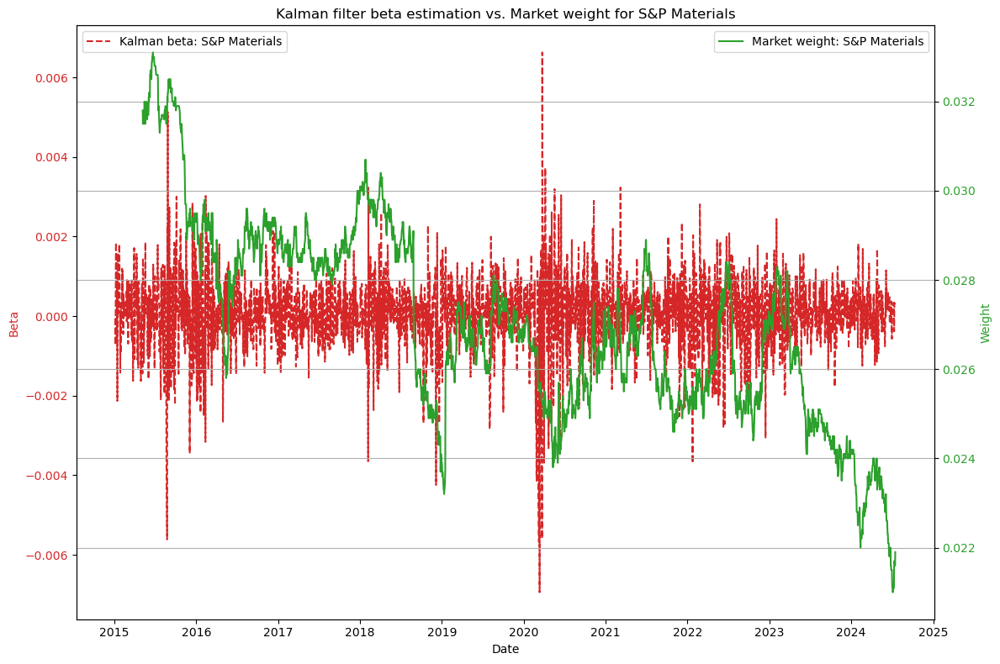

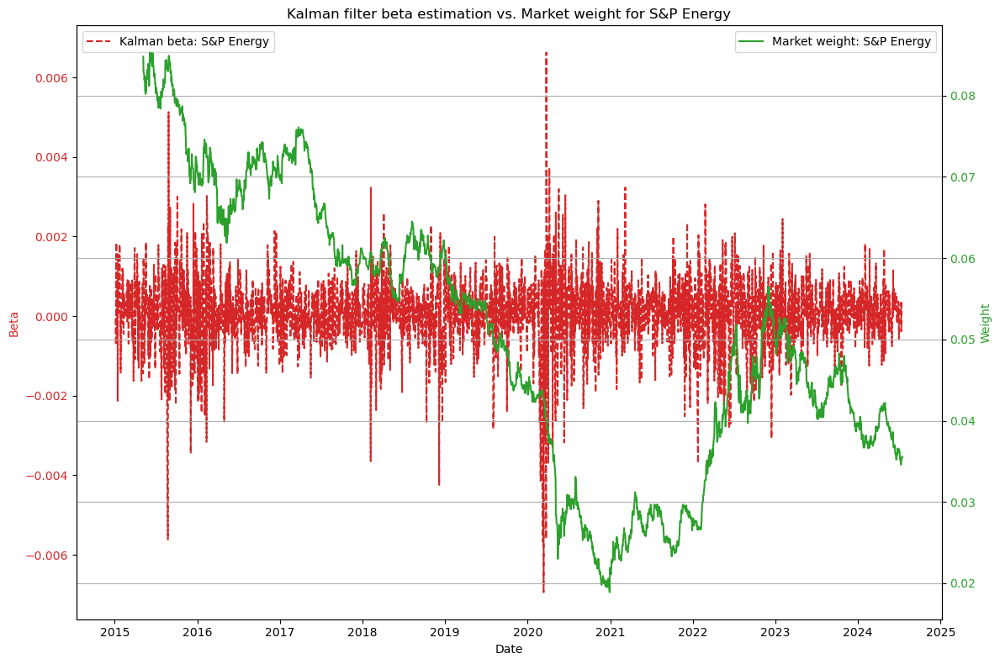

In [466]:
plot_kalman_betas_with_market_weights(filtered_results, data_weights_index)

In [469]:
def plot_double_combined_betas_with_market_weights(rolling_betas, data_weights_index):
    for column in rolling_betas.columns:
        fig, ax1 = plt.subplots(figsize=(12, 8))
        
        # Plot OLS betas
        color = 'tab:blue'
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Beta', color=color)
        ax1.plot(rolling_betas.index, rolling_betas[column], label=f'OLS beta: {column}', color=color, linestyle='--')
        ax1.tick_params(axis='y', labelcolor=color)
        
        # Plot Kalman filter betas
        color = 'tab:red'
        ax1.plot(filtered_results.index, filtered_results[column], label=f'Kalman beta: {column}', color=color, linestyle='-.')
        
        # Plot market weights
        if column in data_weights_index.columns:
            ax2 = ax1.twinx()
            color = 'tab:green'
            ax2.set_ylabel('Weight', color=color)
            ax2.plot(data_weights_index.index, data_weights_index[column], label=f'Market weight: {column}', color=color)
            ax2.tick_params(axis='y', labelcolor=color)
            ax2.legend(loc='upper right')
        else:
            print(f"Warning: '{column}' not found in market weights data.")
        
        ax1.legend(loc='upper left')
        plt.title(f'Comparison of OLS and Kalman betas vs. Market weight for {column}')
        fig.tight_layout()
        plt.grid(True)
        plt.show()

In [ ]:
plot_double_combined_betas_with_market_weights(rolling_betas, data_weights_index)

In [471]:
def plot_triple_combined_betas_with_market_weights(rolling_betas, filtered_results, data_weights_index):
    for column in rolling_betas.columns:
        fig, ax1 = plt.subplots(figsize=(12, 8))

        # Axis for OLS betas
        color = 'tab:blue'
        ax1.set_xlabel('Date')
        ax1.set_ylabel('OLS Beta', color=color)
        ax1.plot(rolling_betas.index, rolling_betas[column], label=f'OLS Beta: {column}', color=color, linestyle='--')
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.legend(loc='upper left')

        # Secondary axis for market weights
        if column in data_weights_index.columns:
            ax2 = ax1.twinx() 
            color = 'tab:green'
            ax2.set_ylabel('Market Weight', color=color)
            ax2.plot(data_weights_index.index, data_weights_index[column], label=f'Market weight: {column}', color=color)
            ax2.tick_params(axis='y', labelcolor=color)
            ax2.legend(loc='upper right')

        # Tertiary axis for Kalman filter betas
        if column in filtered_results.columns:
            ax3 = ax1.twinx()  
            ax3.spines['right'].set_position(('outward', 60))  # Offset the third axis to avoid overlap
            color = 'tab:red'
            ax3.set_ylabel('Kalman Beta', color=color)
            ax3.plot(filtered_results.index, filtered_results[column], label=f'Kalman beta: {column}', color=color, linestyle='-.')
            ax3.tick_params(axis='y', labelcolor=color)
            ax3.legend(loc='upper center')

        plt.title(f'Comparison of OLS and Kalman betas vs. Market weight for {column}')
        fig.tight_layout()
        plt.grid(True)
        plt.show()

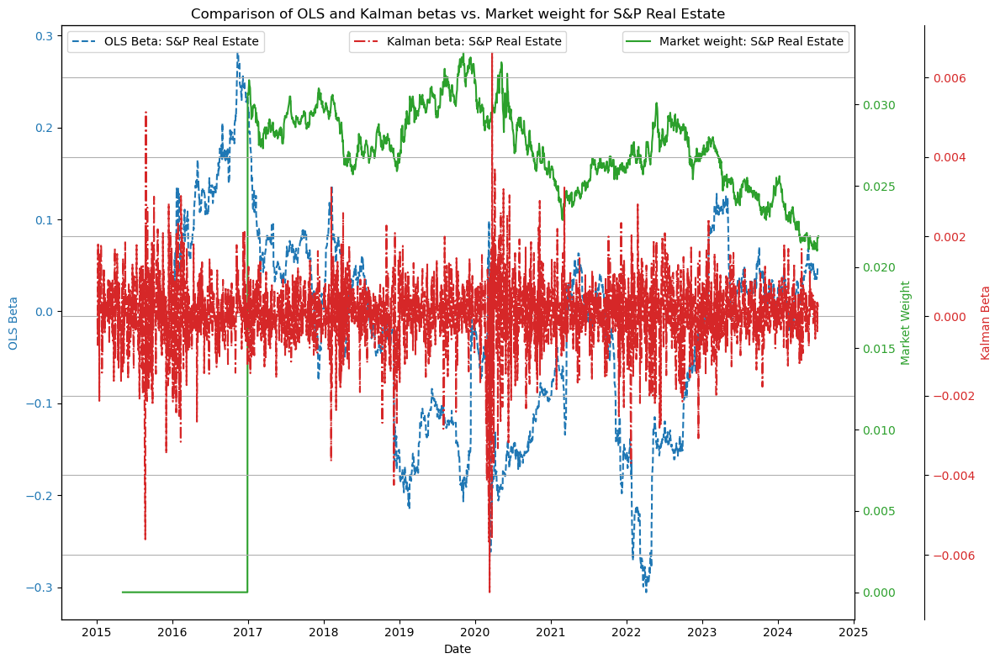

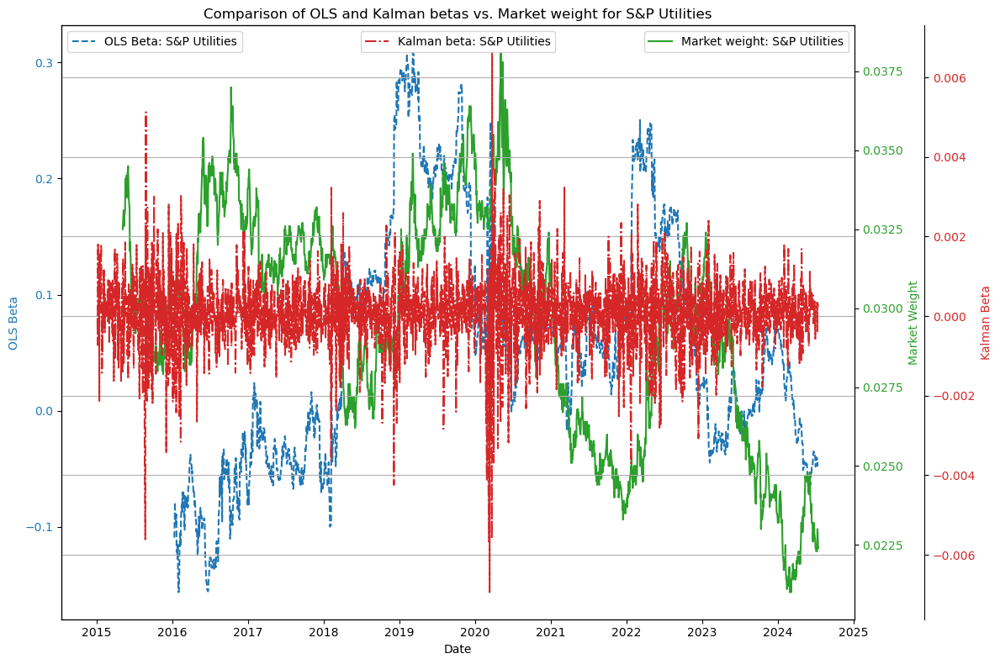

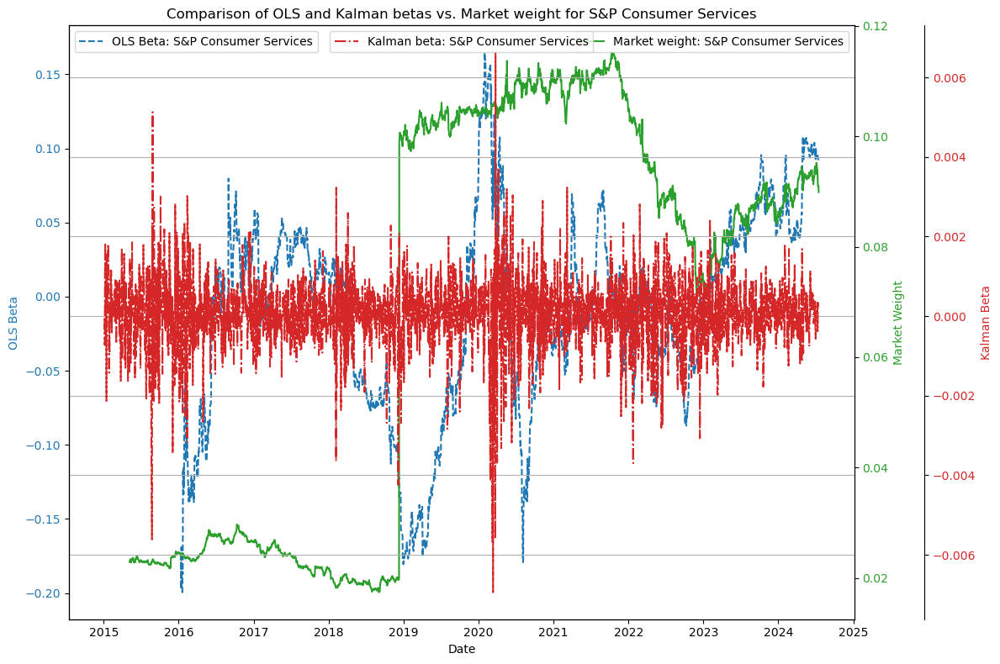

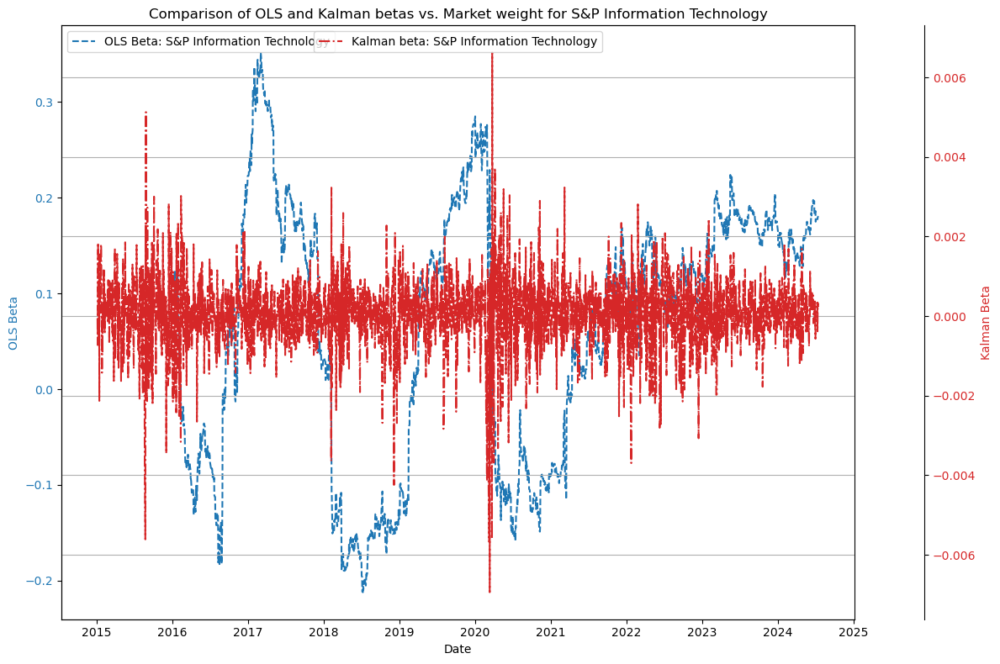

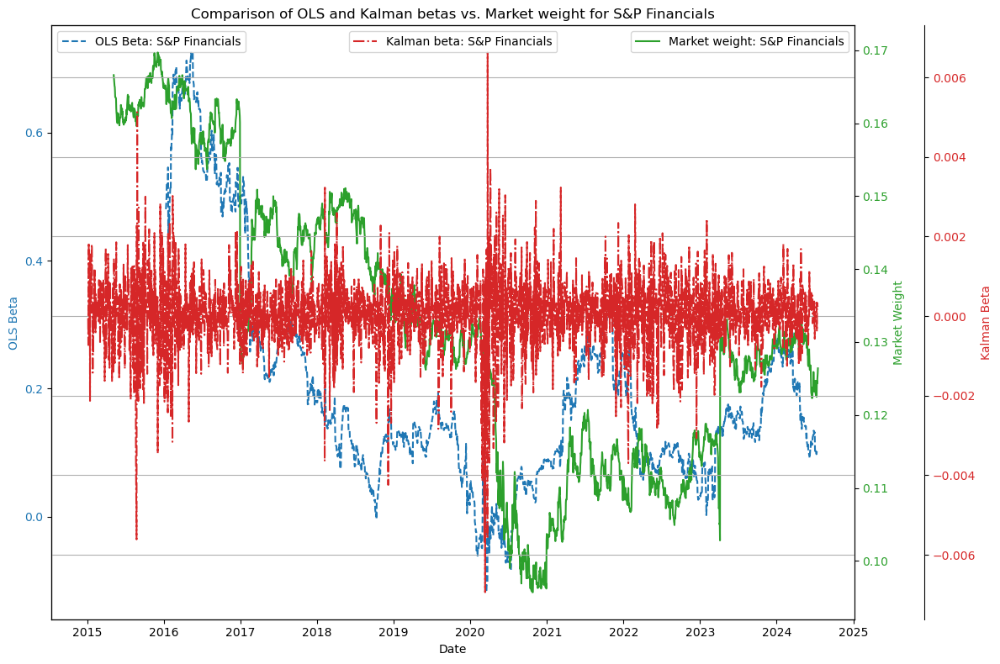

...

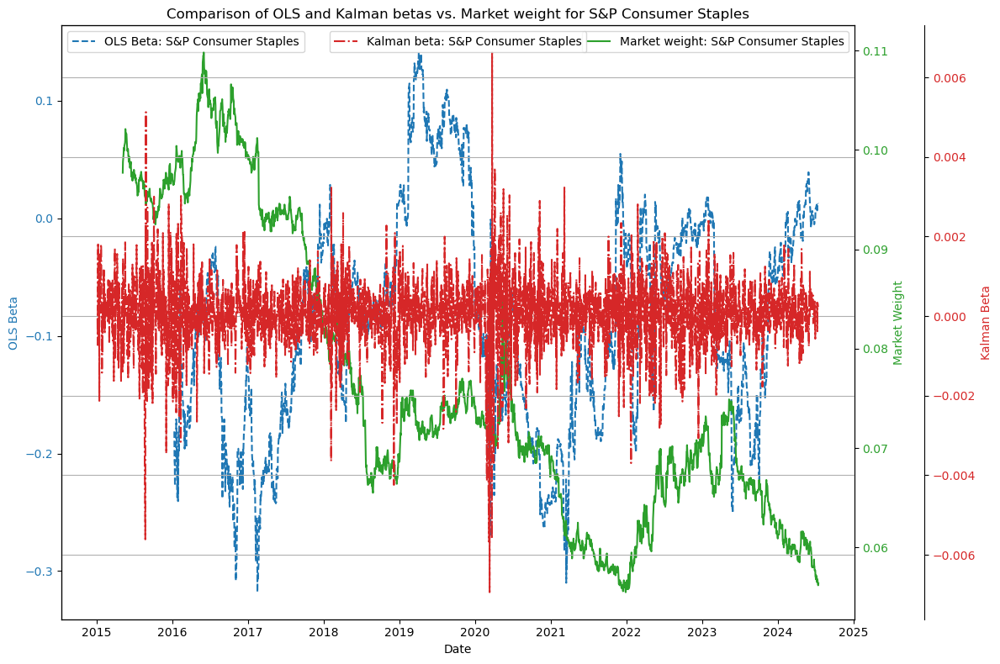

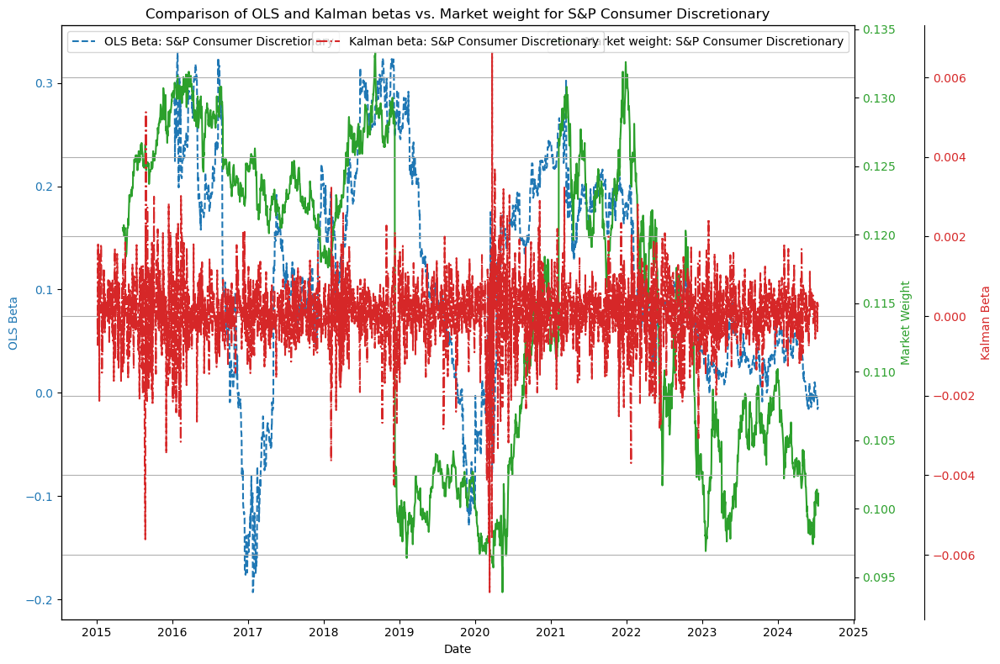

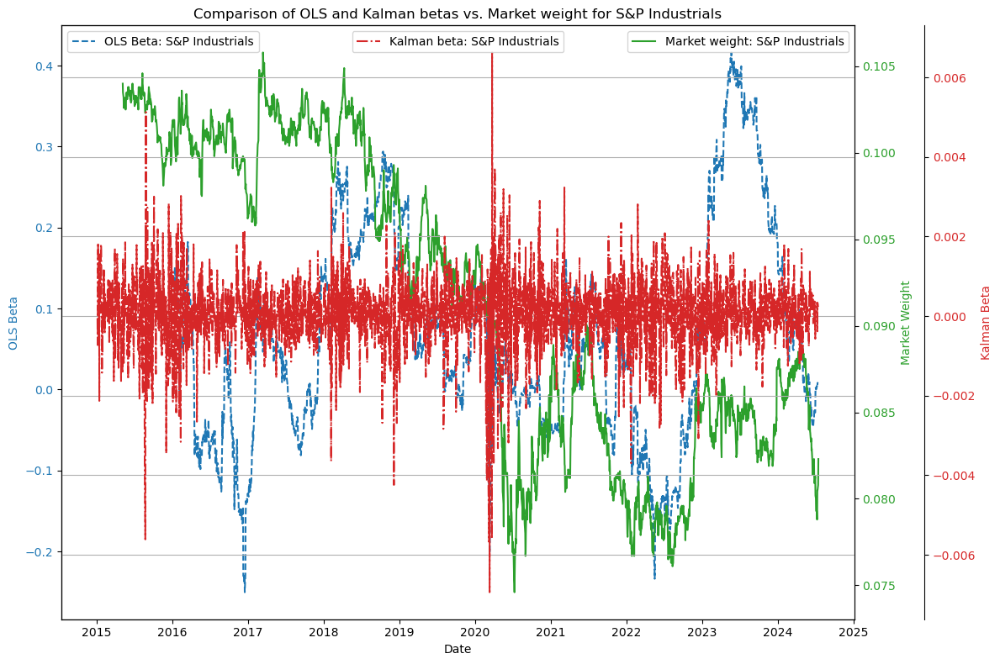

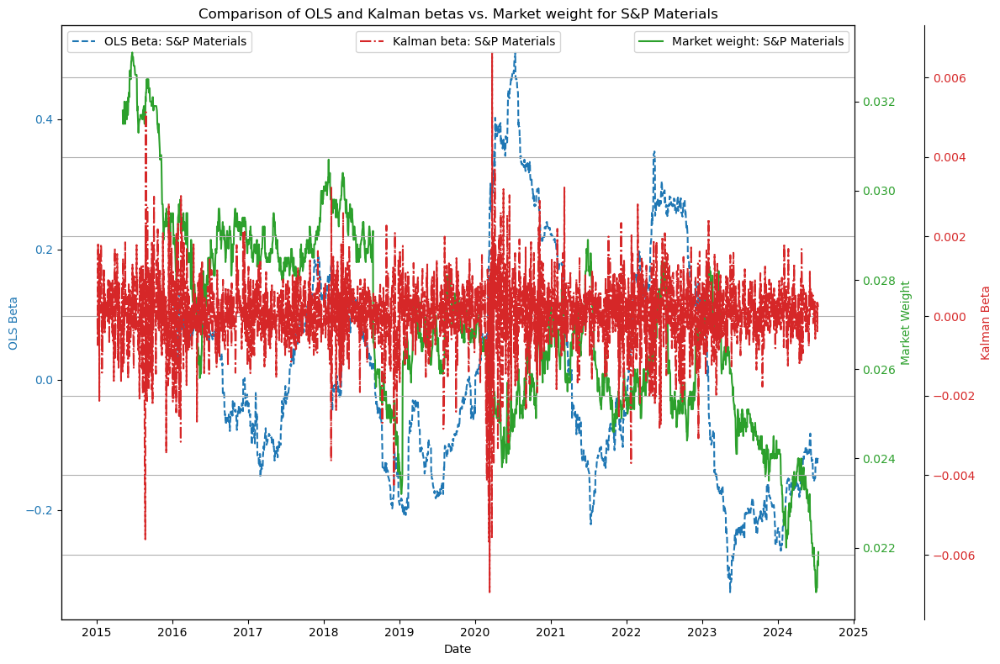

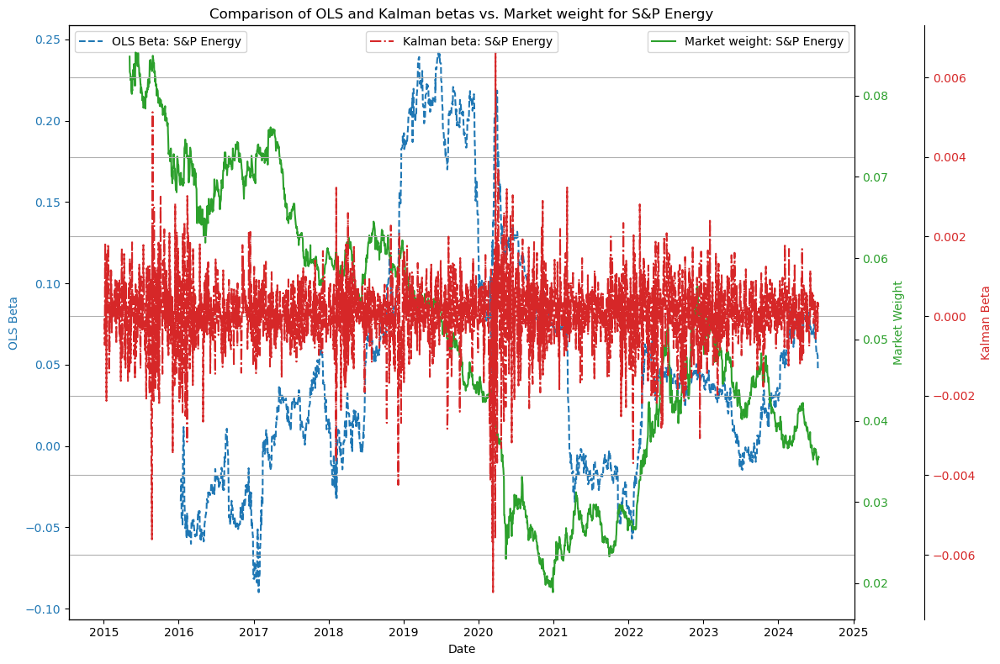

In [472]:
plot_triple_combined_betas_with_market_weights(rolling_betas, filtered_results, data_weights_index)